<a href="https://colab.research.google.com/github/mikolaj553/Machine-Learning-Homeworks-Repo/blob/main/ml_hw8.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Homework #8 - Mikołaj Kowalewski, lab group np. 1

In this homework assignment, we attempt to reconstruct an ellipse defined by two foci and a constant sum of distances $C$, using gradient descent under three non-quadratic loss norms: $\ell_0$, $\ell_1$, and $\ell_\infty$. We will automatically run all three experiments sequentially, showing how the points evolve and whether the training loss actually converges. The three functions under considerations are:



The three loss functions are

$$
\ell_{0} \;=\; \frac{1}{N}\sum_{i=1}^{N} \mathbf{1}\bigl(\varepsilon_{i}\neq 0\bigr)
$$

$$
\ell_{1} \;=\; \frac{1}{N}\sum_{i=1}^{N} \lvert \varepsilon_{i}\rvert
$$

$$
\ell_{\infty} \;=\; \max_{1 \le i \le N}\lvert \varepsilon_{i}\rvert
$$

where each residual $\varepsilon_{i}$ is

$$
\varepsilon_{i} \;=\; \lVert p_{i}-f_{1}\rVert \;+\;\lVert p_{i}-f_{2}\rVert \;-\;C
$$

Here $p_{i}$ is the $i$-th point, $f_{1},f_{2}$ are the two foci, and $C$ is the target sum of distances.


Notice that gradient descent works by computing a derivative of the loss with respect to each parameter and then updating in the direction that reduces that loss. The $ℓ₀$ loss, however, is defined by an indicator that is 1 whenever a point lies off the ellipse and 0 when it lies exactly on it. As a result, its value jumps abruptly between 0 and 1, and the slope is zero everywhere except at the discontinuities — where the derivative is not defined in the traditional sense. Because gradient descent requires a well-defined, nonzero gradient to make updates, it has no signal to move points closer to satisfying $d_1 + d_2 = C$, and the $ℓ₀$ loss remains stuck at its initial value - the training would not progress. For this reason, moving forward, we will only be considering the $ℓ_1$ and $ℓ_∞$ losses.


In [ ]:
#Imports and plotting pipeline
import torch
import matplotlib.pyplot as plt
import numpy as np

def plot_results(epoch, trajectories, loss_history=None):
    if loss_history is not None:
      fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    else:
      fig, axes = plt.subplots(1, 1, figsize=(6, 6))
      axes = [axes]
    points = np.array([trajectories[i][-1] for i in range(num_points)])
    # Left plot: Scatter of points with trajectories
    axes[0].scatter(points[:, 0], points[:, 1], label=f'Points - Epoch {epoch}')
    f1 = focus1.detach().cpu().numpy()
    f2 = focus2.detach().cpu().numpy()
    axes[0].scatter([f1[0], f2[0]], [f1[1], f2[1]], color='red', marker='x', s=100, label='Foci')

    # Draw movement traces
    for i in range(num_points):
        trajectory = np.array(trajectories[i])
        axes[0].plot(trajectory[:, 0], trajectory[:, 1], color='gray', linestyle='-', linewidth=0.5)

    axes[0].set_xlabel('X')
    axes[0].set_ylabel('Y')
    axes[0].legend()


    axes[0].grid()

    if loss_history is not None:
      axes[0].set_title(f'Points after Epoch {epoch}')
      # Right plot: Loss history
      axes[1].plot(loss_history, color='blue')
      axes[1].set_xlabel("Epoch")
      axes[1].set_ylabel("Loss")
      axes[1].set_title("Loss Convergence")
      axes[1].grid()
    else:
      axes[0].set_title(f'Points before Epoch {epoch}')

    plt.show()


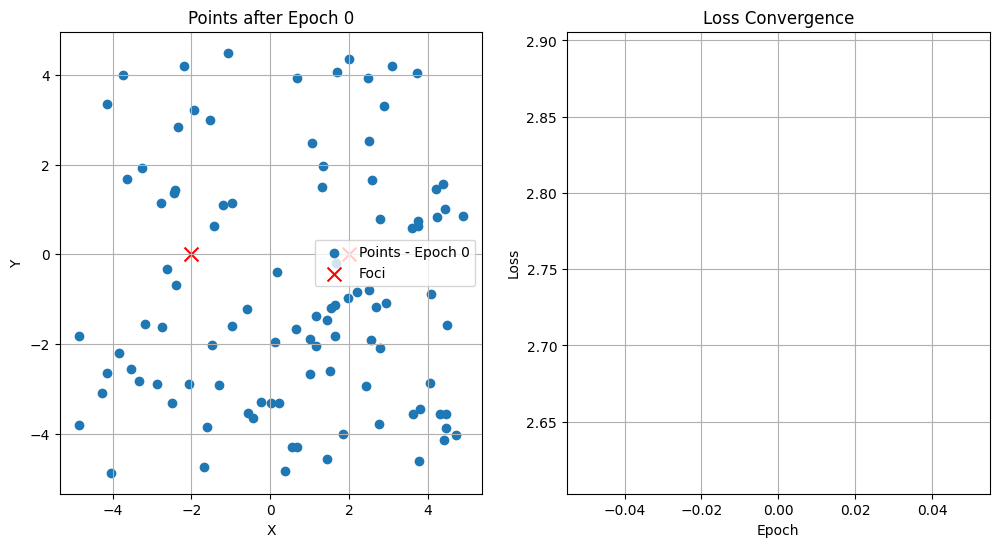

Epoch 0: Loss = 2.754212


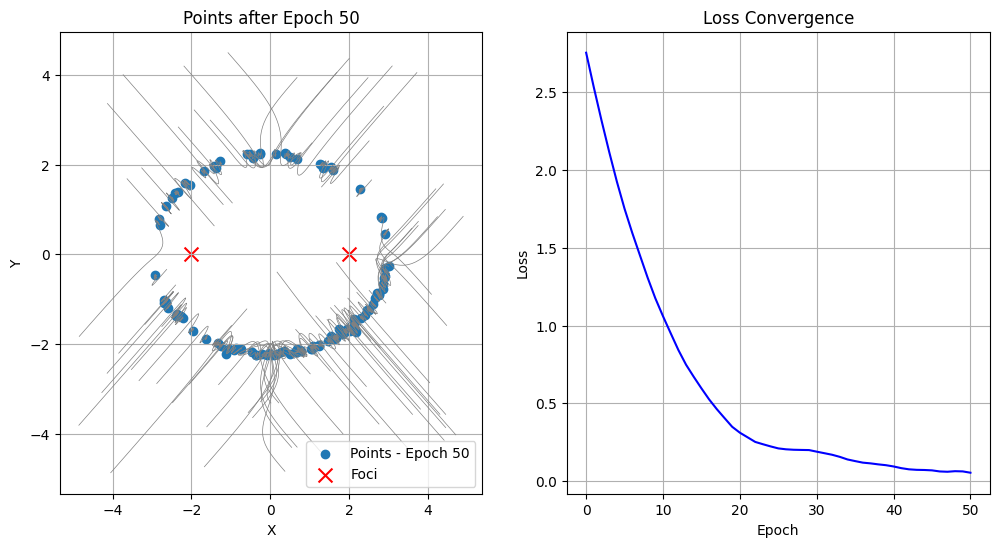

Epoch 50: Loss = 0.053497


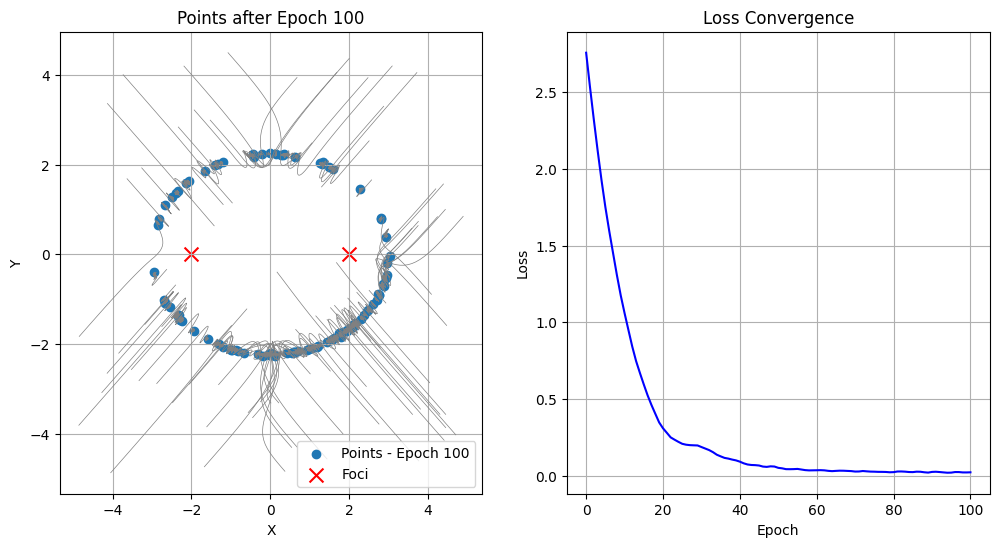

Epoch 100: Loss = 0.024422


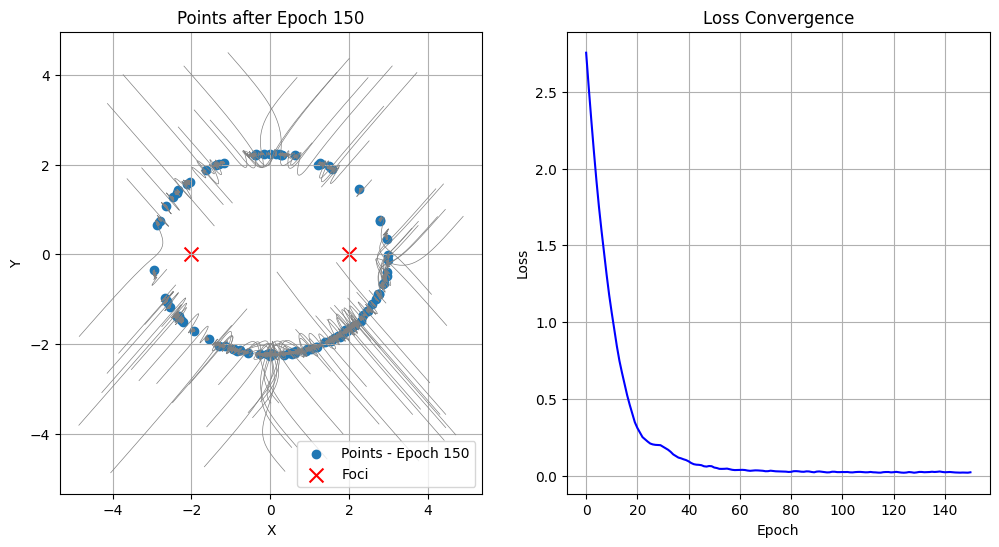

Epoch 150: Loss = 0.022459


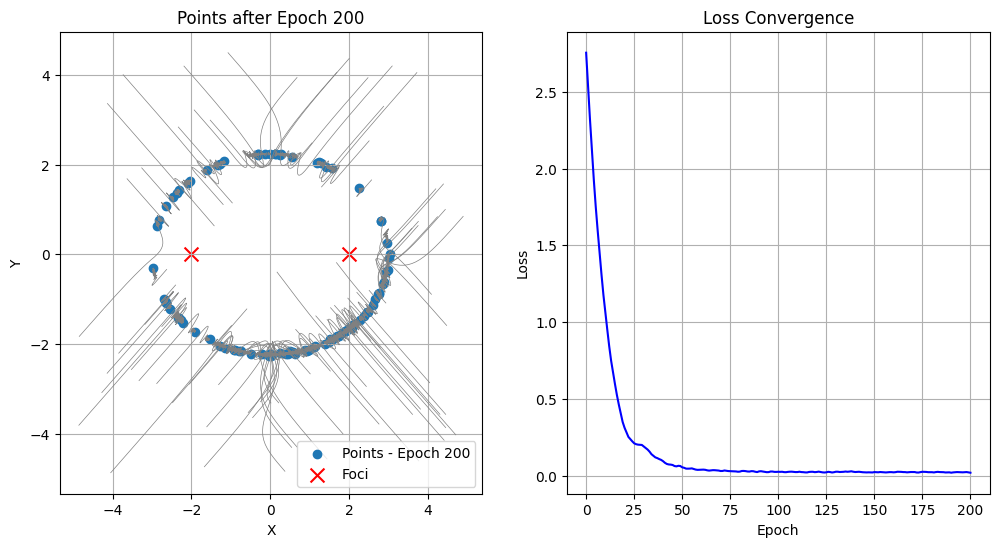

Epoch 200: Loss = 0.018269


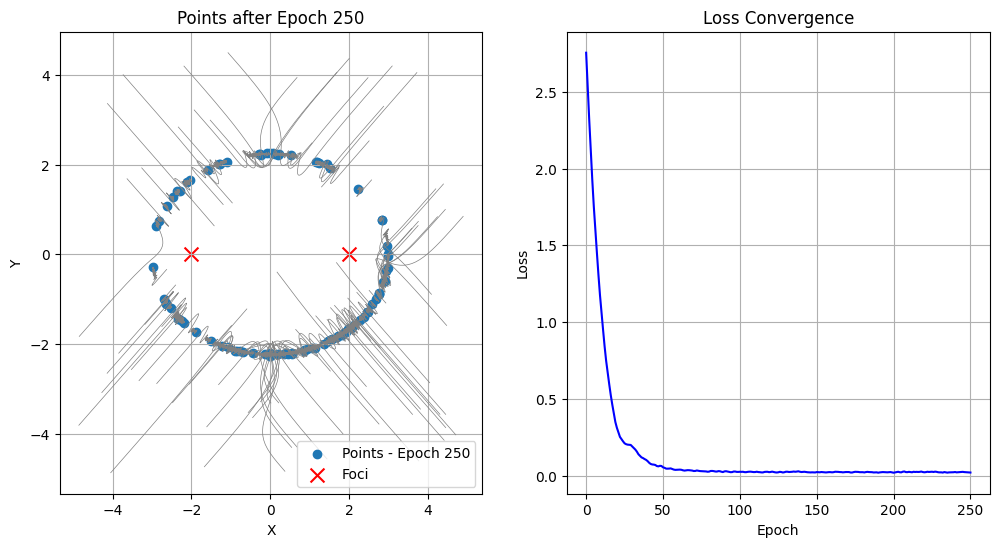

Epoch 250: Loss = 0.019486


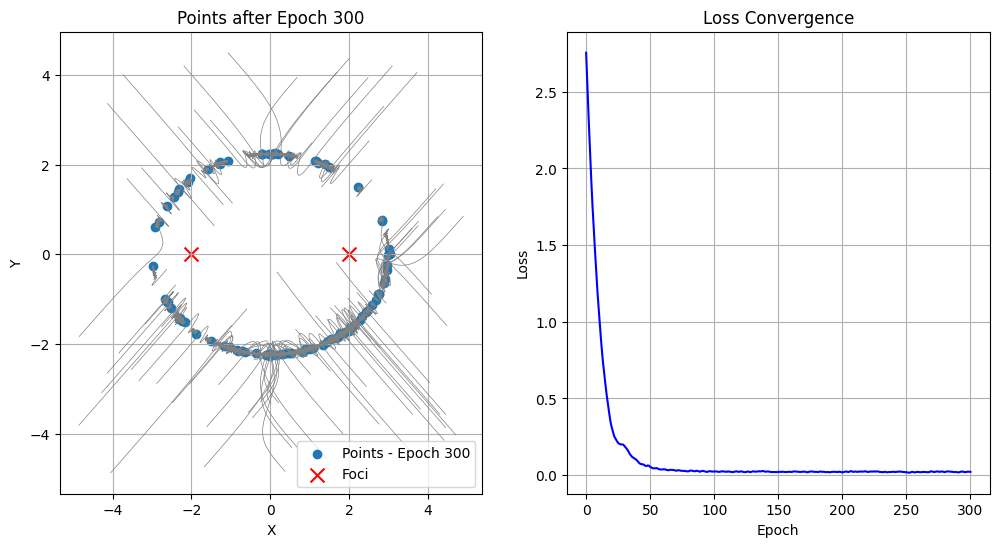

Epoch 300: Loss = 0.021560


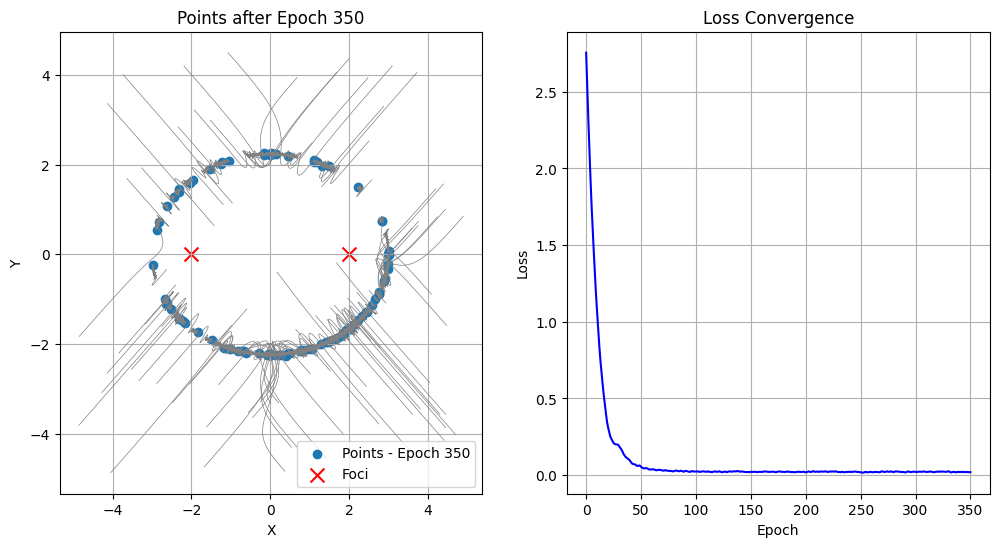

Epoch 350: Loss = 0.019547


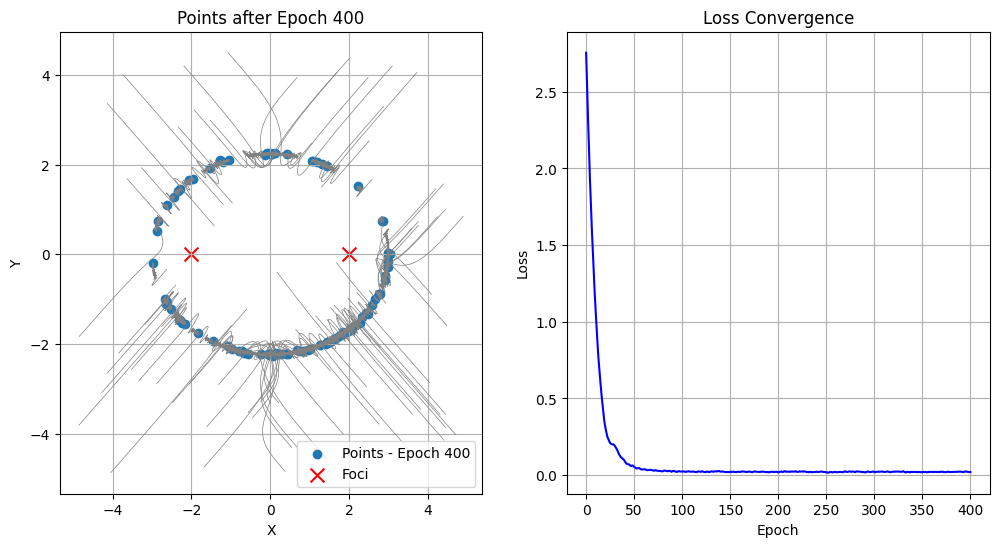

Epoch 400: Loss = 0.020092


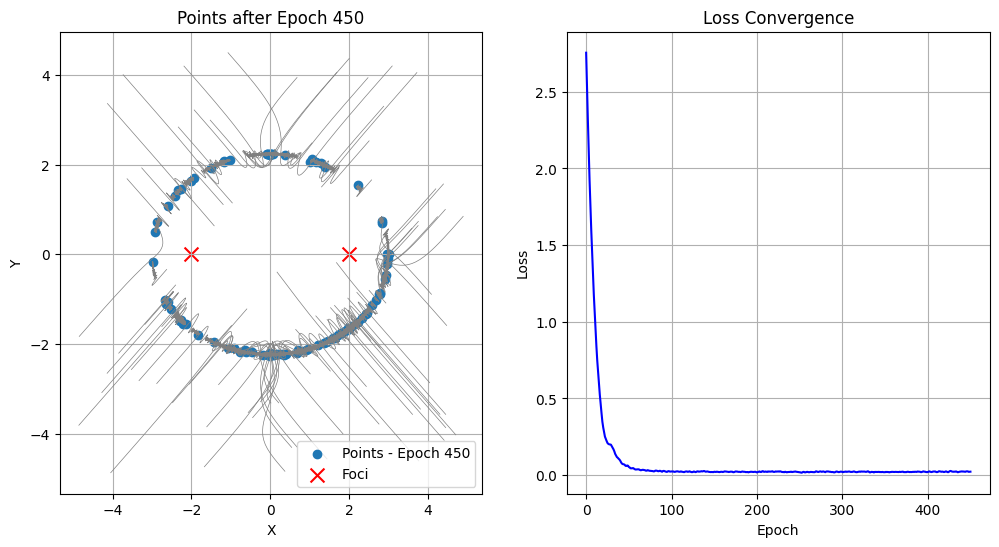

Epoch 450: Loss = 0.022939


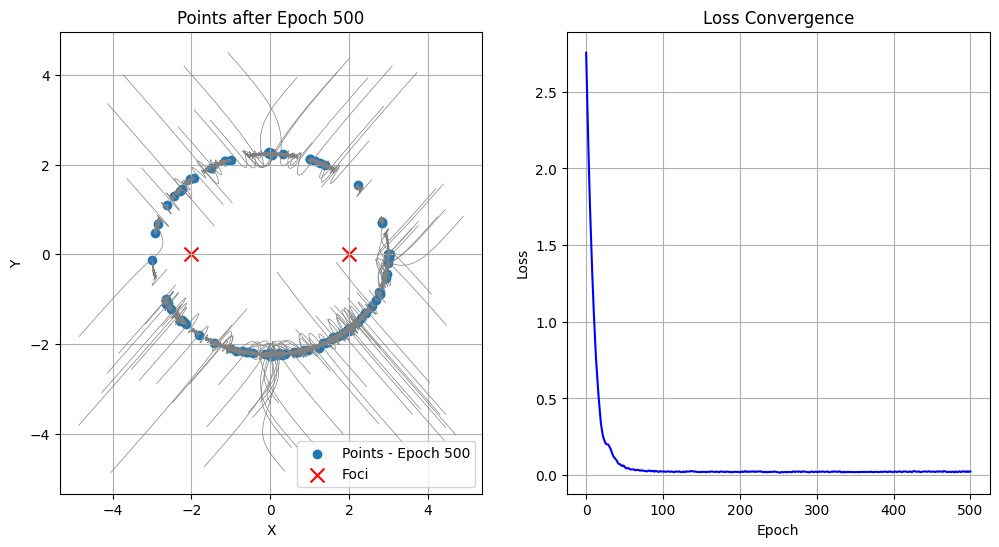

Epoch 500: Loss = 0.023886


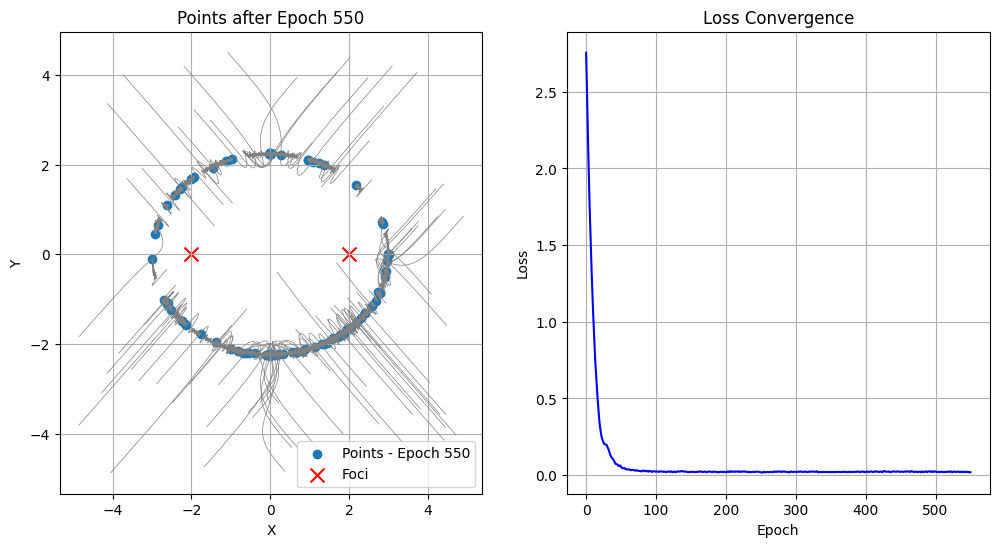

Epoch 550: Loss = 0.018744


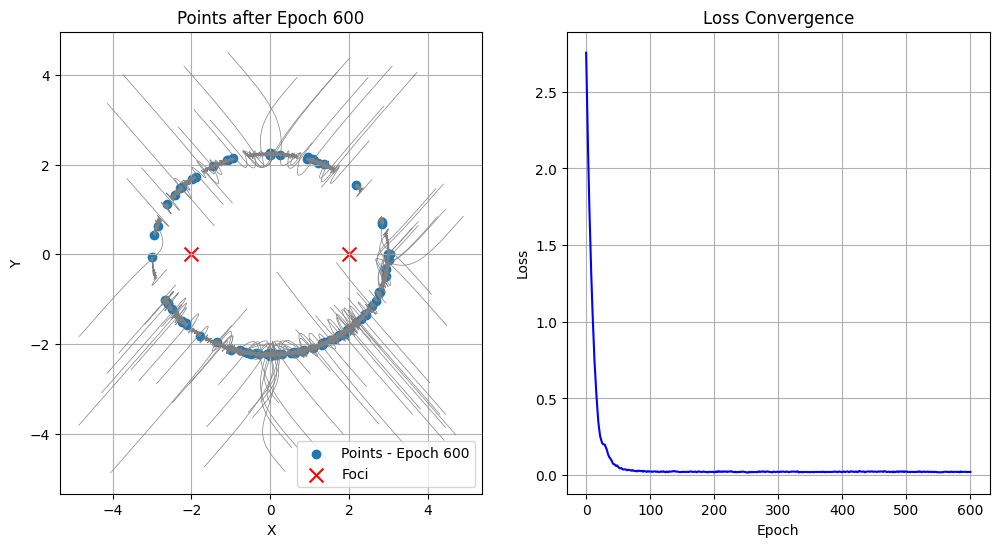

Epoch 600: Loss = 0.021063


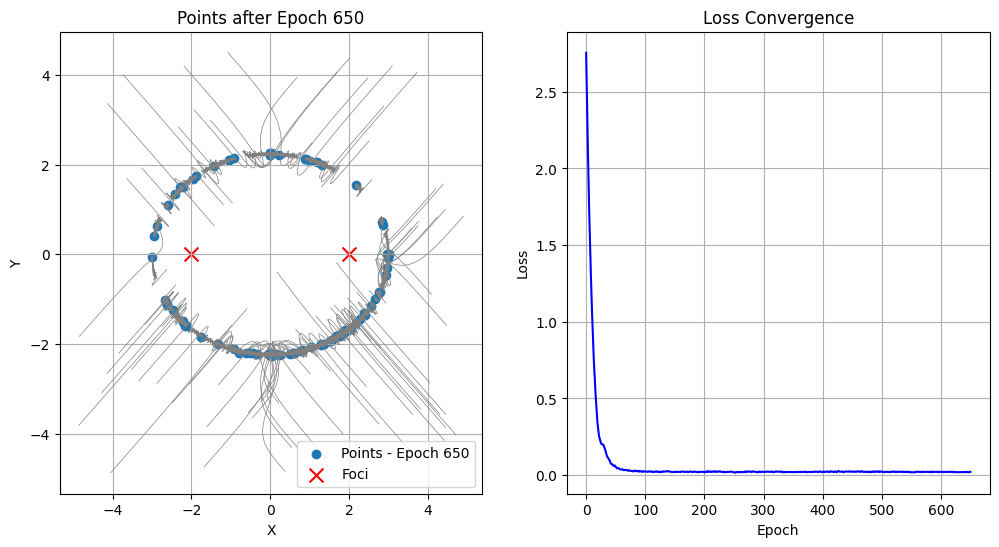

Epoch 650: Loss = 0.022061


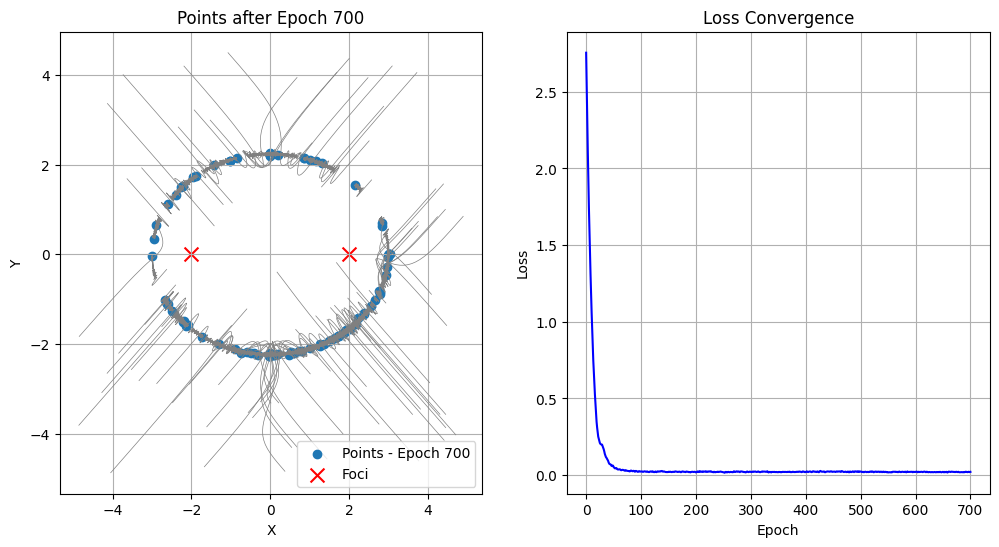

Epoch 700: Loss = 0.021499


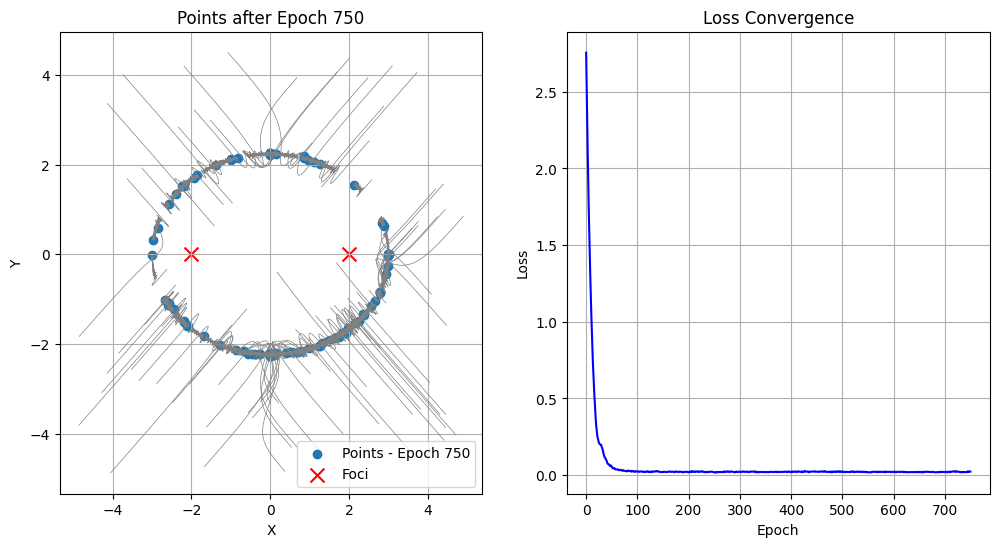

Epoch 750: Loss = 0.023329


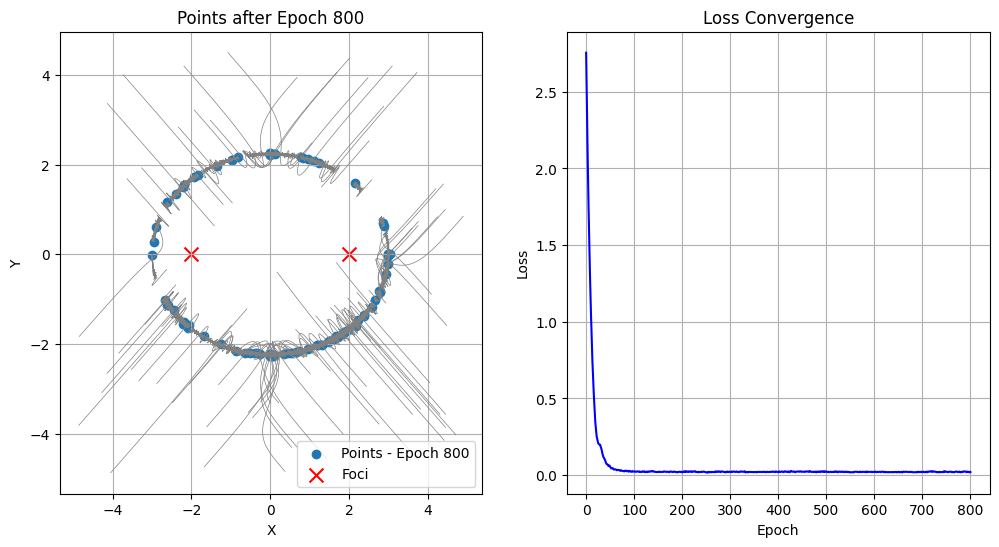

Epoch 800: Loss = 0.020740


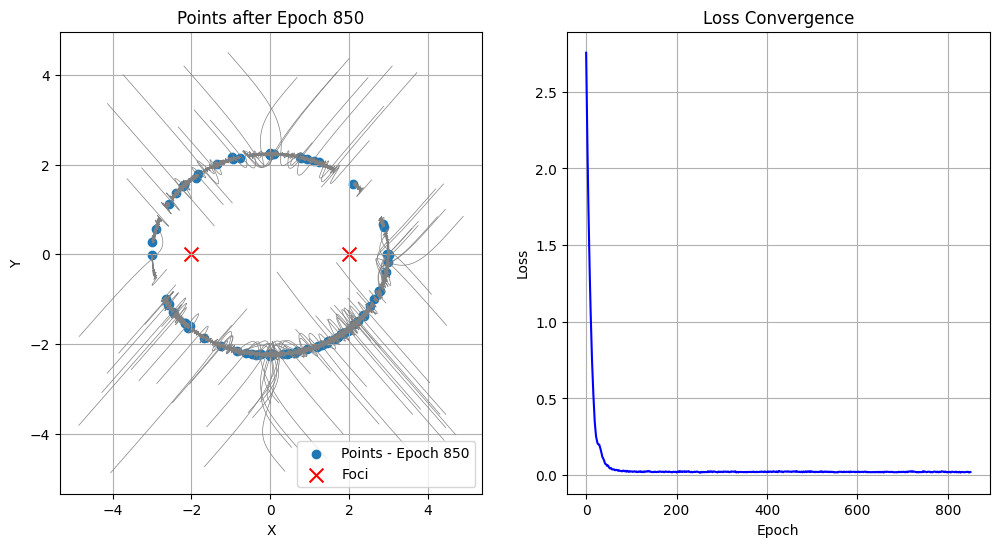

Epoch 850: Loss = 0.020643


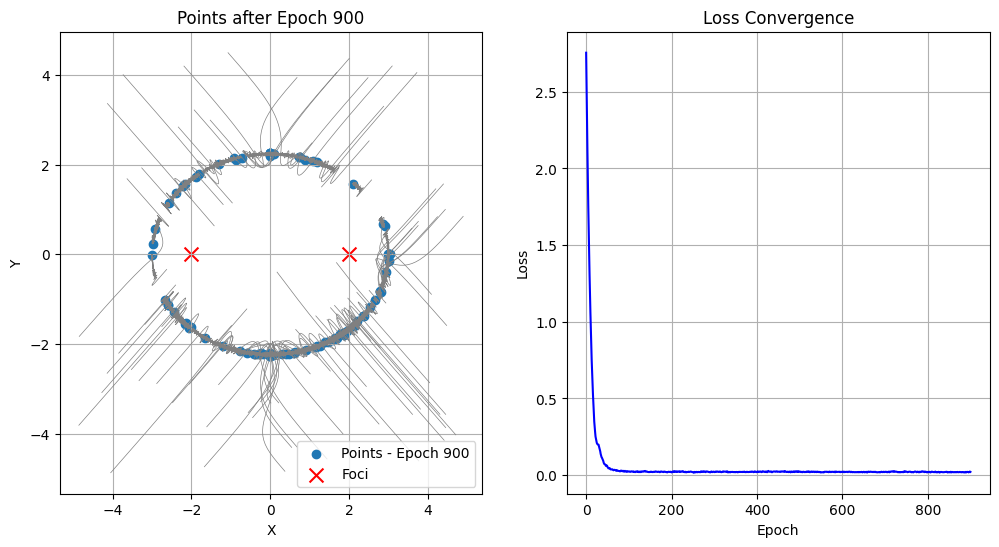

Epoch 900: Loss = 0.021521


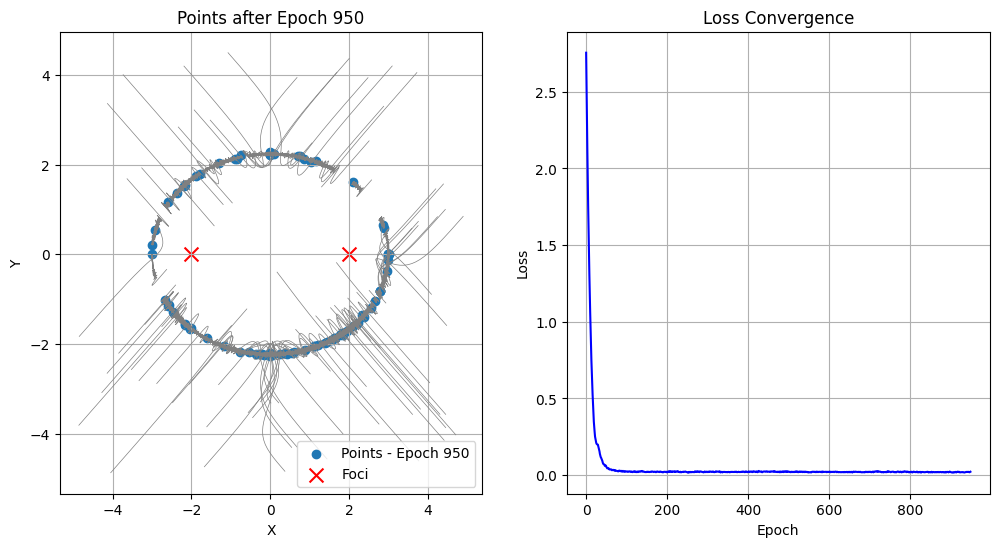

Epoch 950: Loss = 0.022483


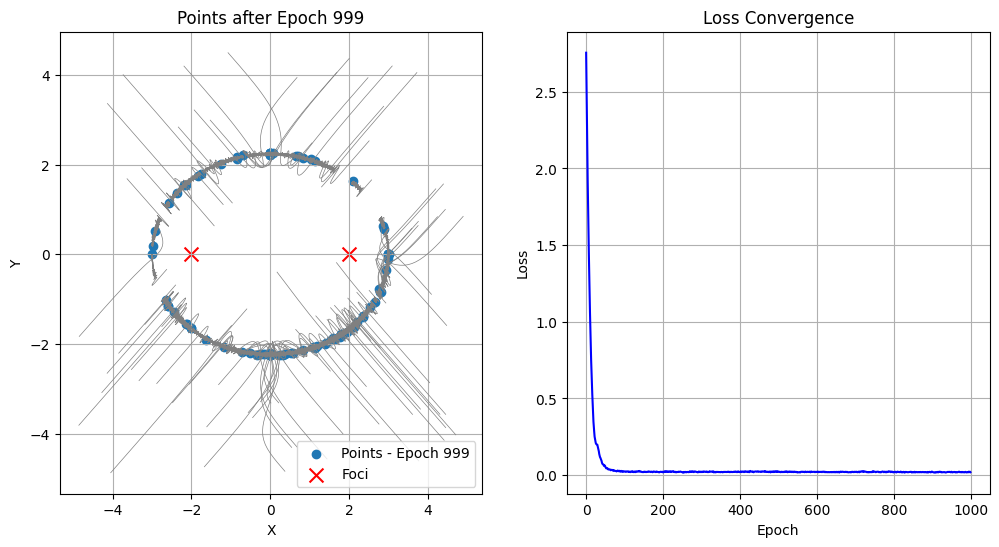

Elapsed time: 21.23323965072632 seconds


In [21]:
#The l_1 loss

# Fix the random seed for reproducibility
torch.manual_seed(42)
np.random.seed(42)

# Define ellipse parameters
focus1 = torch.tensor([-2.0, 0.0])  # First focus
focus2 = torch.tensor([2.0, 0.0])   # Second focus
constant_sum = 6.0  # The sum of distances to the two foci

# Initialize random 2D points from uniform distribution
num_points = 100
points = torch.rand((num_points, 2)) * 10 - 5  # Uniformly distributed in [-5, 5]
points.requires_grad = True

# Reset trajectories
trajectories = [[] for _ in range(num_points)]
loss_history = []


import time
# Start timing
start_time = time.time()


# Define optimizer
optimizer = torch.optim.Adam([points], lr=0.1)

# Training loop
num_epochs = 1000
for epoch in range(num_epochs):
    optimizer.zero_grad()

    # Compute distances to both foci
    dist1 = torch.norm(points - focus1, dim=1)
    dist2 = torch.norm(points - focus2, dim=1)



    # l_1 loss
    loss_1= torch.mean(torch.abs(dist1 + dist2 - constant_sum))
    loss_1.backward()
    optimizer.step()

    loss_history.append(loss_1.item())

    # Store current positions for tracking movement
    for i in range(num_points):
        trajectories[i].append(points[i].detach().cpu().clone().numpy())

    # Plot results every 50th epoch
    if epoch % 50 == 0:
        plot_results(epoch, trajectories, loss_history)

    if epoch % 50 == 0:
        print(f"Epoch {epoch}: Loss = {loss_1.item():.6f}")

#Final plot
plot_results(epoch, trajectories, loss_history)


# End timing
end_time = time.time()

# Calculate the elapsed time
elapsed_time = end_time - start_time
print(f"Elapsed time: {elapsed_time} seconds")


After 1000 epochs the $ℓ₁$ norm distance‐transform loss remains stuck on a nonzero plateau, oscillating around 0.02, even though the ellipse is drawn accurately because the absolute‐value penalty introduces a flat, nondifferentiable region around zero residuals that no gradient step can penetrate. The subgradient at zero error can take any value between –1 and +1, so each mini‐batch update still jitters the parameters back and forth without ever reducing the loss further. Moreover, the stochastic variation inherent to mini‐batch training prevents the model from ever landing exactly on the set of parameters that would yield zero residuals for every sample. In this case, the training curve stalls on a strictly positive floor and does not converge to zero despite exhaustive parameter updates. We will now inspect whether adjusting, or rather, introducing a decaying learning rate will help.

Epoch 0: Loss = 2.754212 | LR = 9.950000e-02


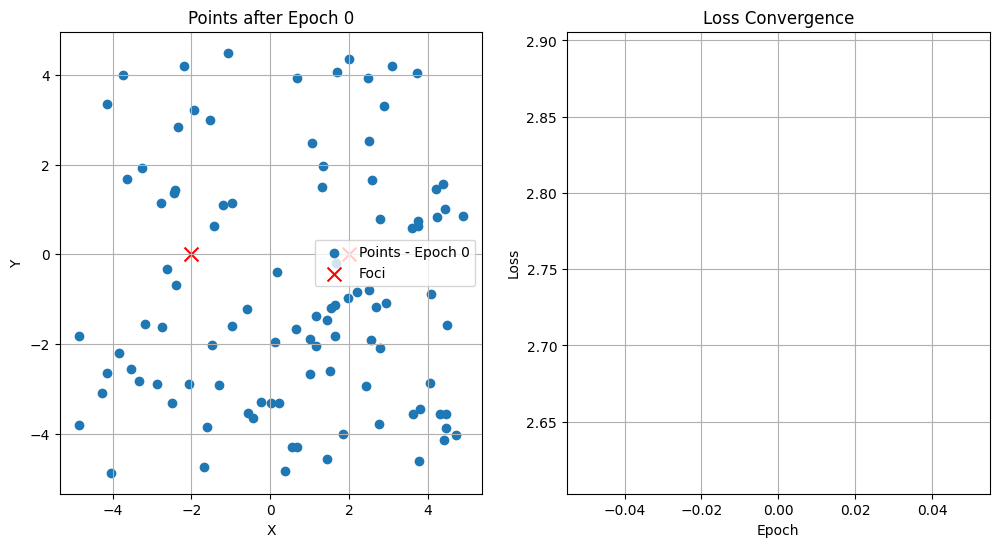

Epoch 50: Loss = 0.057072 | LR = 7.744210e-02


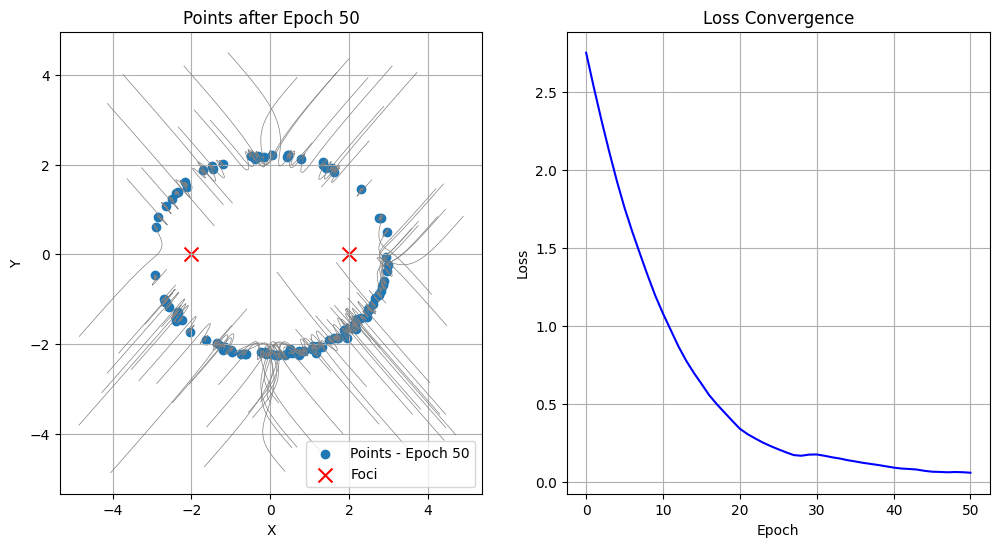

Epoch 100: Loss = 0.016990 | LR = 6.027416e-02


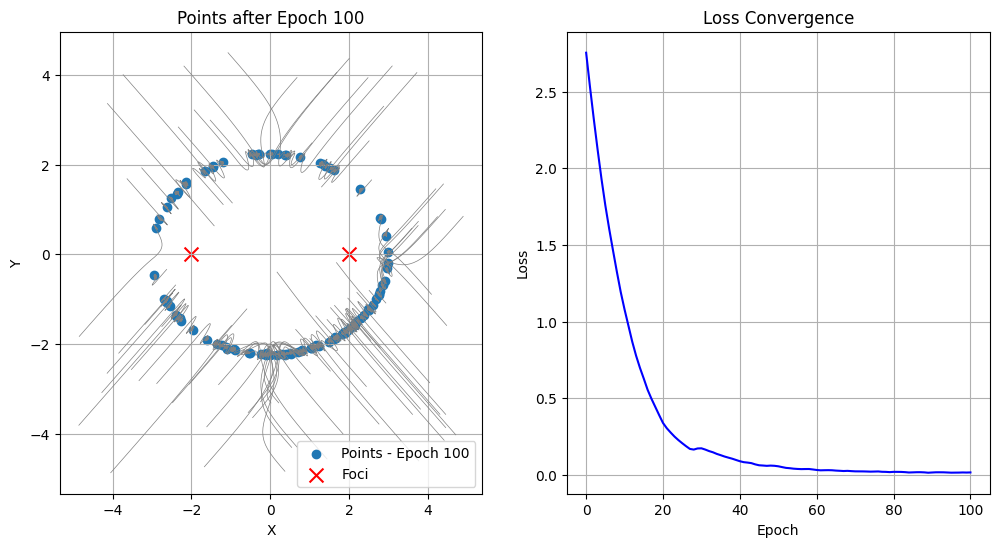

Epoch 150: Loss = 0.011965 | LR = 4.691213e-02


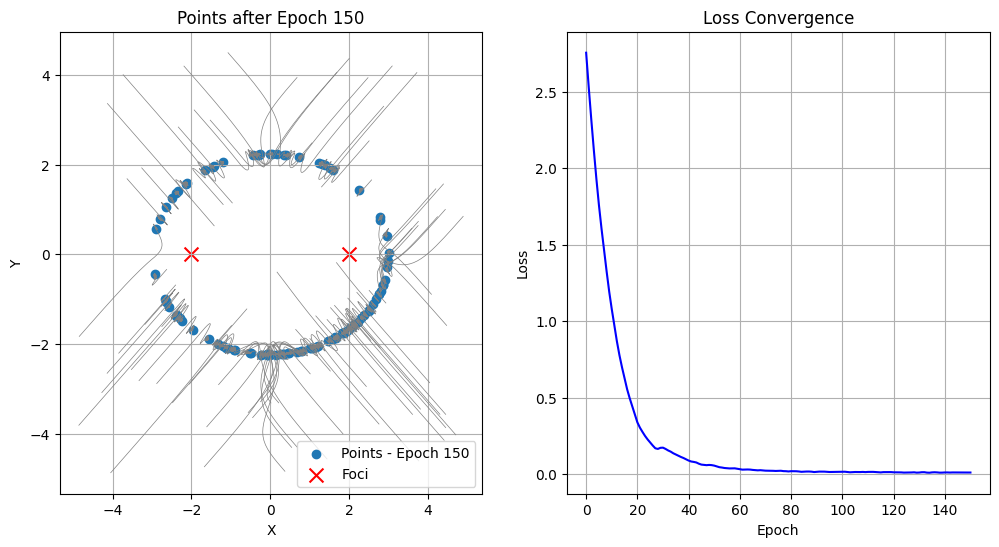

Epoch 200: Loss = 0.007409 | LR = 3.651230e-02


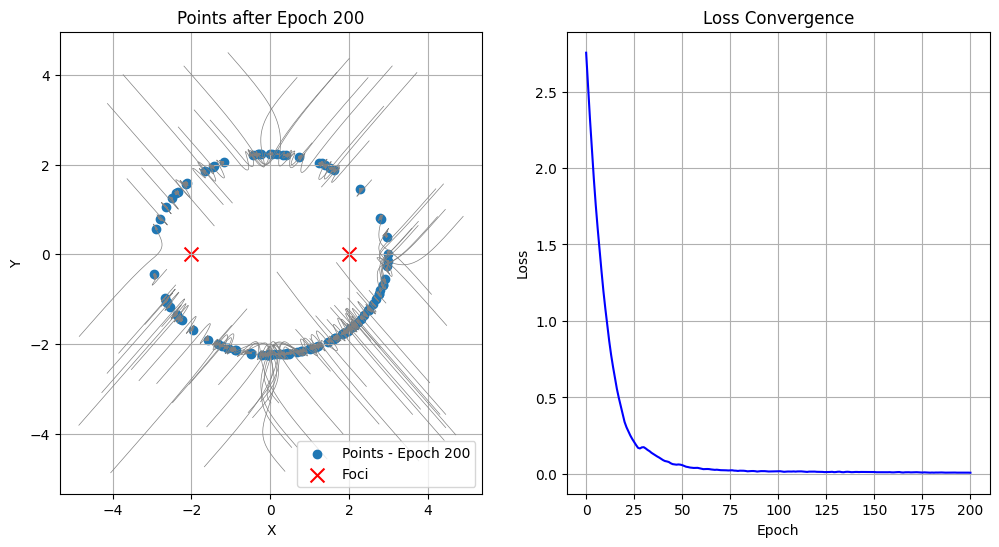

Epoch 250: Loss = 0.006026 | LR = 2.841798e-02


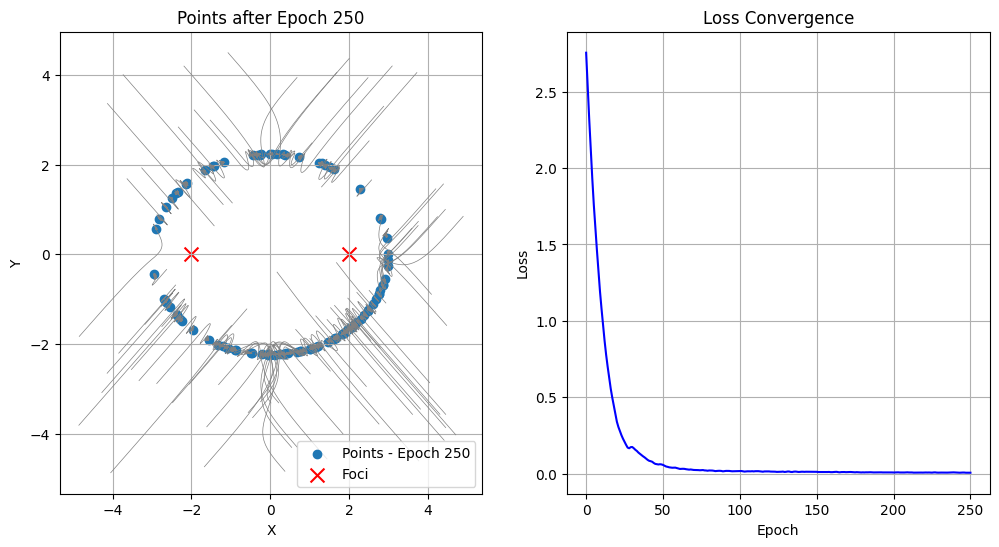

Epoch 300: Loss = 0.004197 | LR = 2.211807e-02


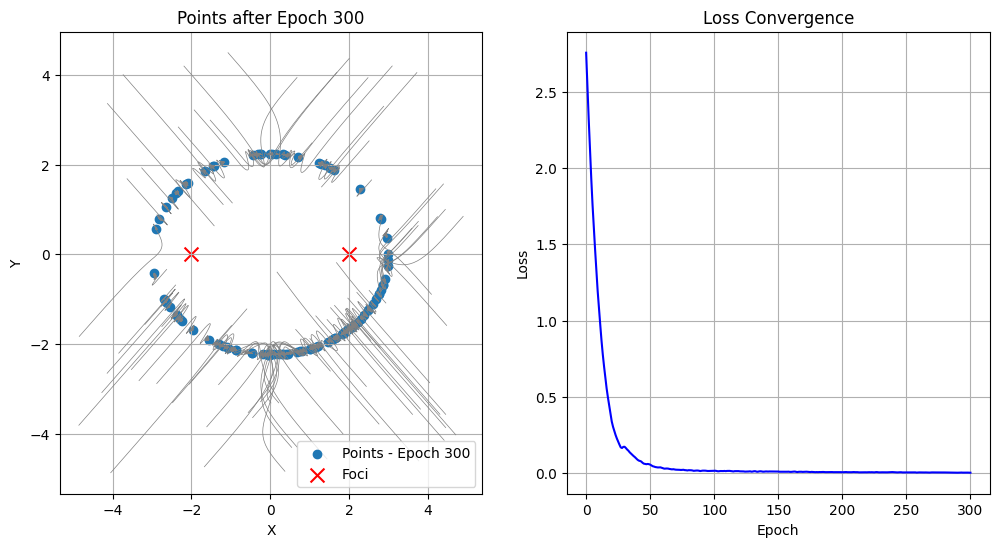

Epoch 350: Loss = 0.004073 | LR = 1.721477e-02


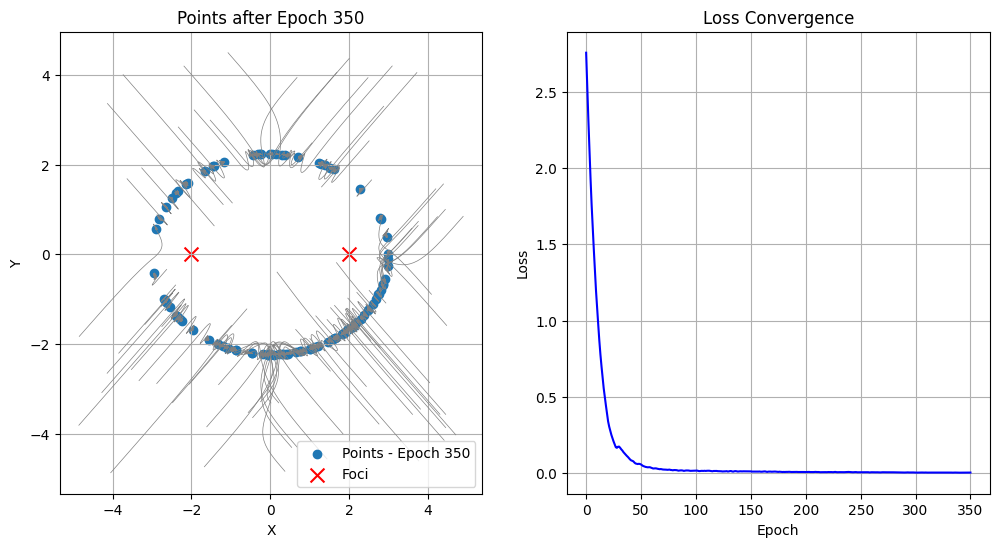

Epoch 400: Loss = 0.002905 | LR = 1.339848e-02


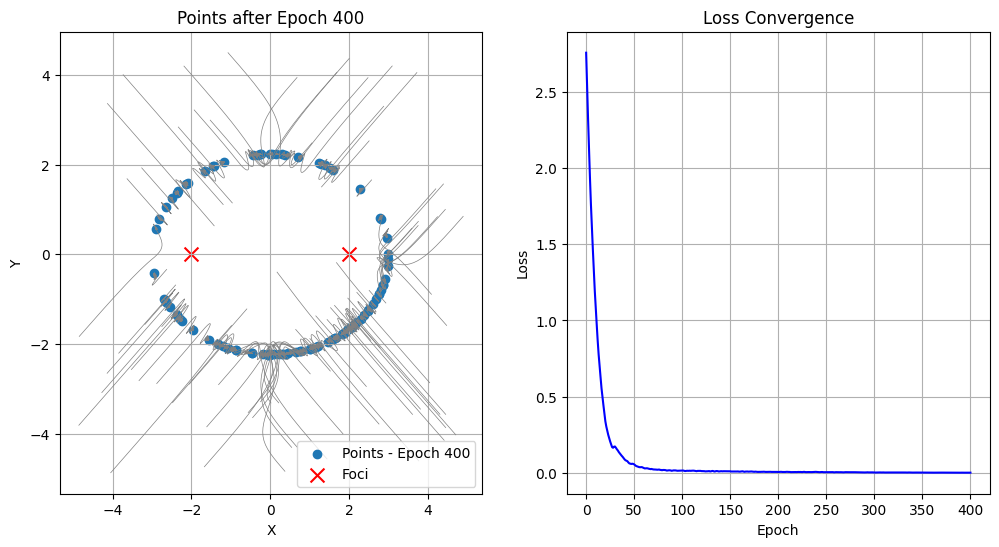

Epoch 450: Loss = 0.002313 | LR = 1.042820e-02


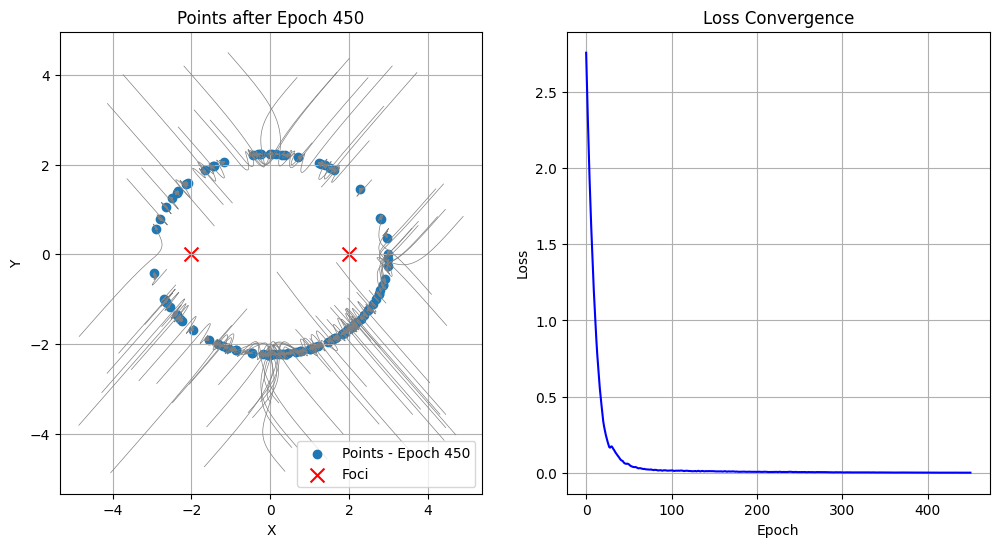

Epoch 500: Loss = 0.001972 | LR = 8.116400e-03


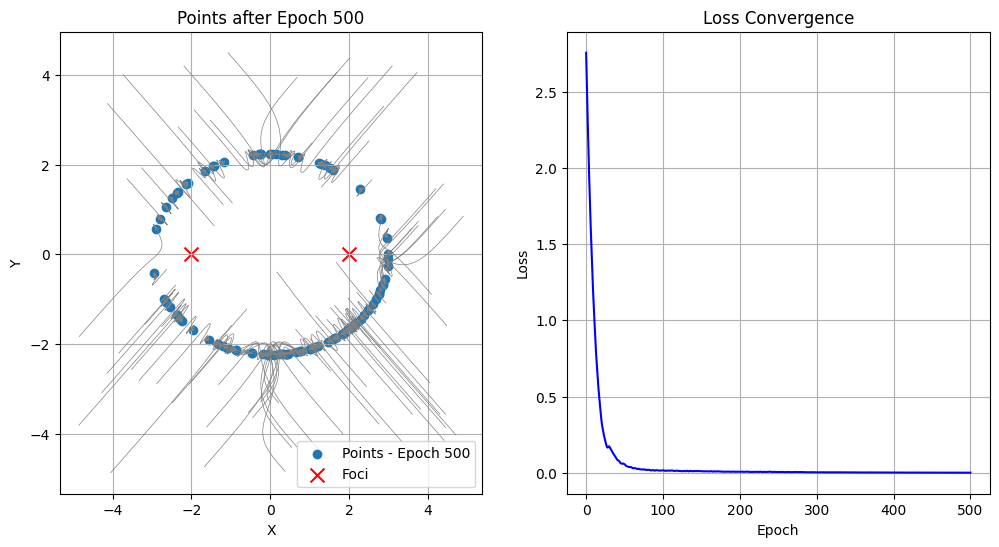

Epoch 550: Loss = 0.001285 | LR = 6.317096e-03


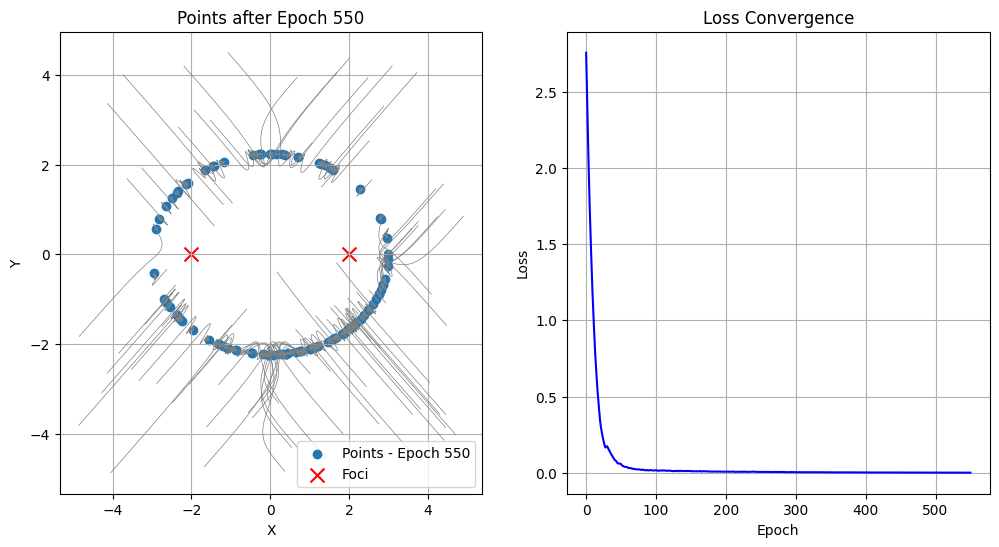

Epoch 600: Loss = 0.000968 | LR = 4.916675e-03


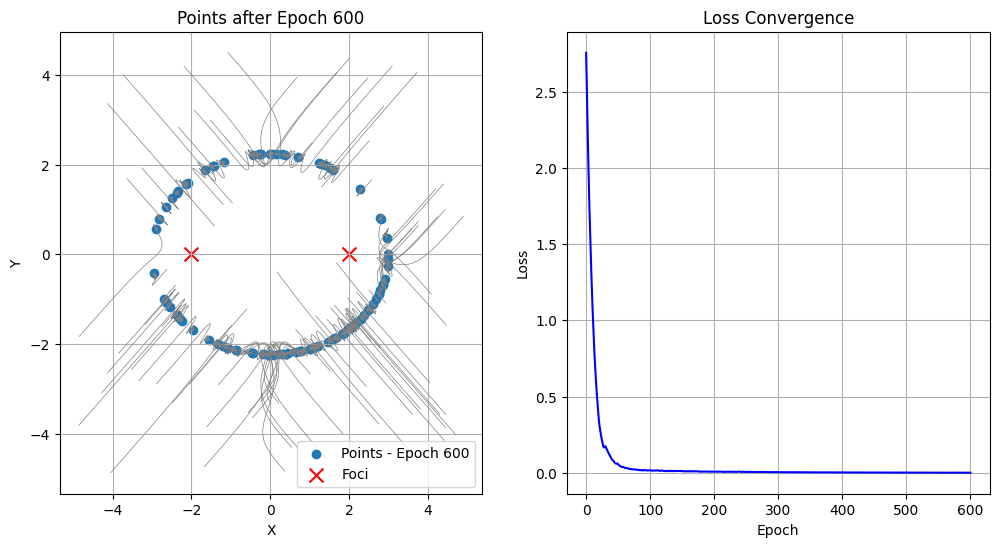

Epoch 650: Loss = 0.000875 | LR = 3.826710e-03


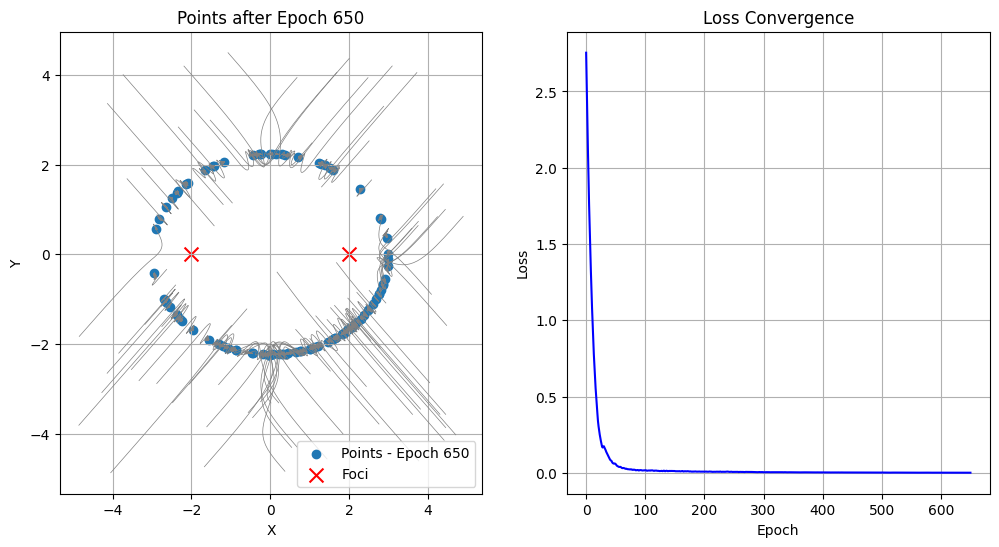

Epoch 700: Loss = 0.000648 | LR = 2.978377e-03


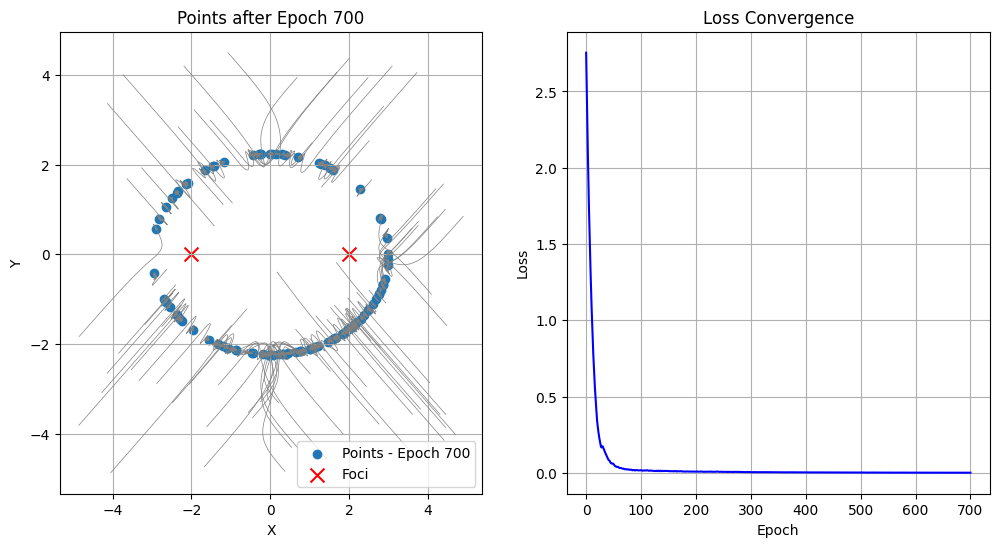

Epoch 750: Loss = 0.000501 | LR = 2.318108e-03


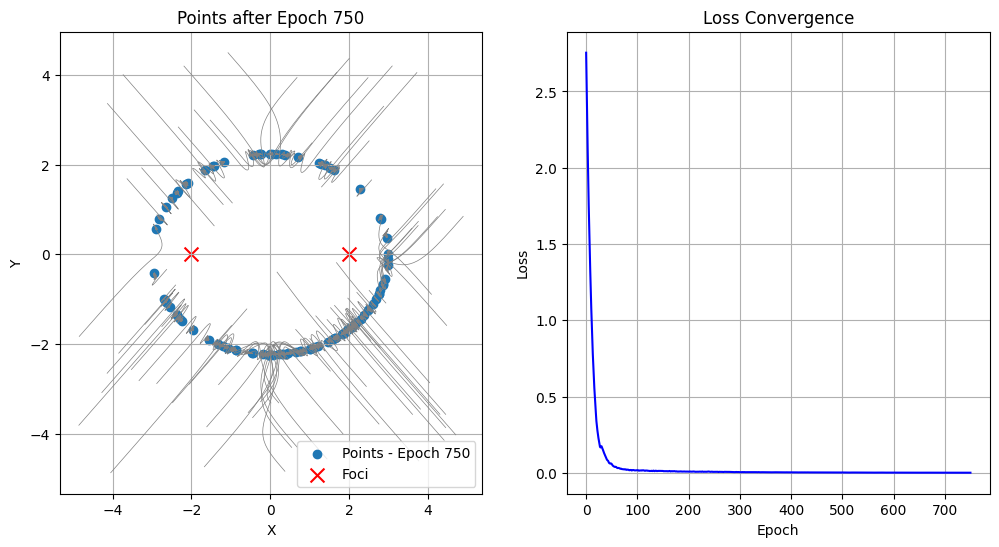

Epoch 800: Loss = 0.000403 | LR = 1.804212e-03


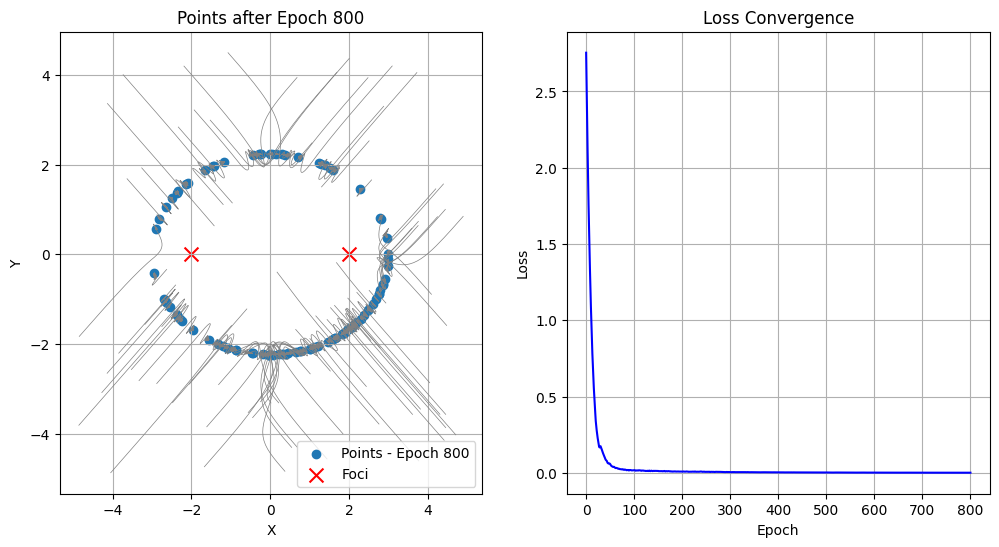

Epoch 850: Loss = 0.000277 | LR = 1.404241e-03


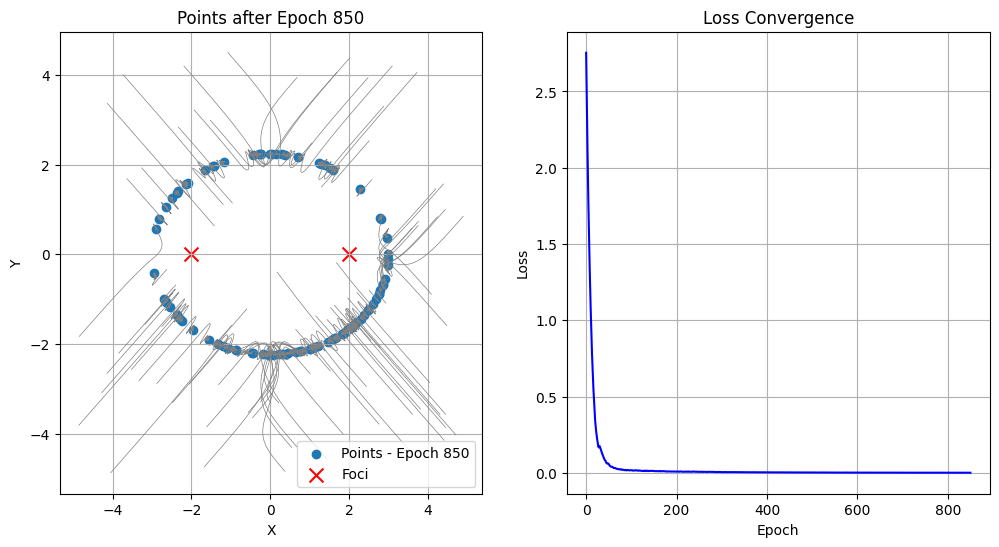

Epoch 900: Loss = 0.000281 | LR = 1.092939e-03


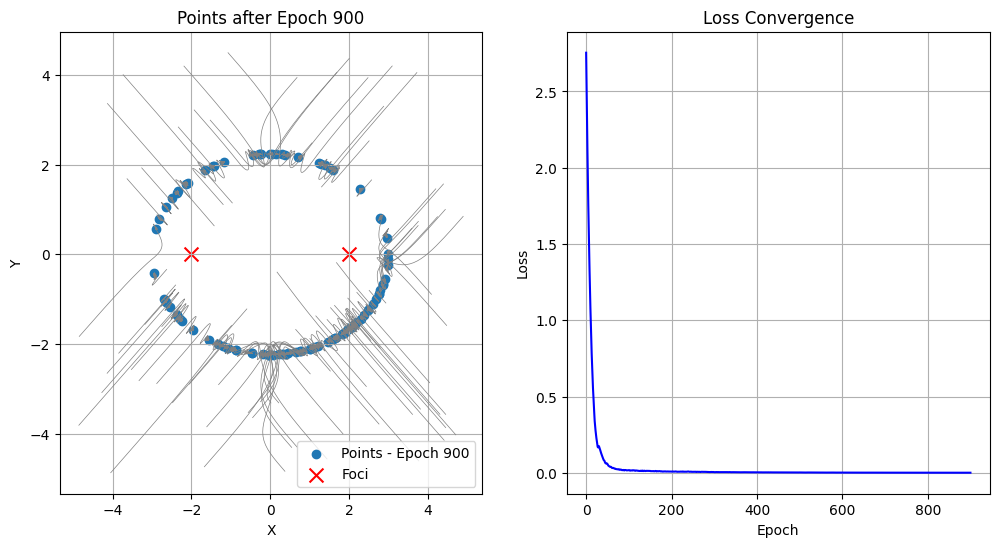

Epoch 950: Loss = 0.000202 | LR = 8.506478e-04


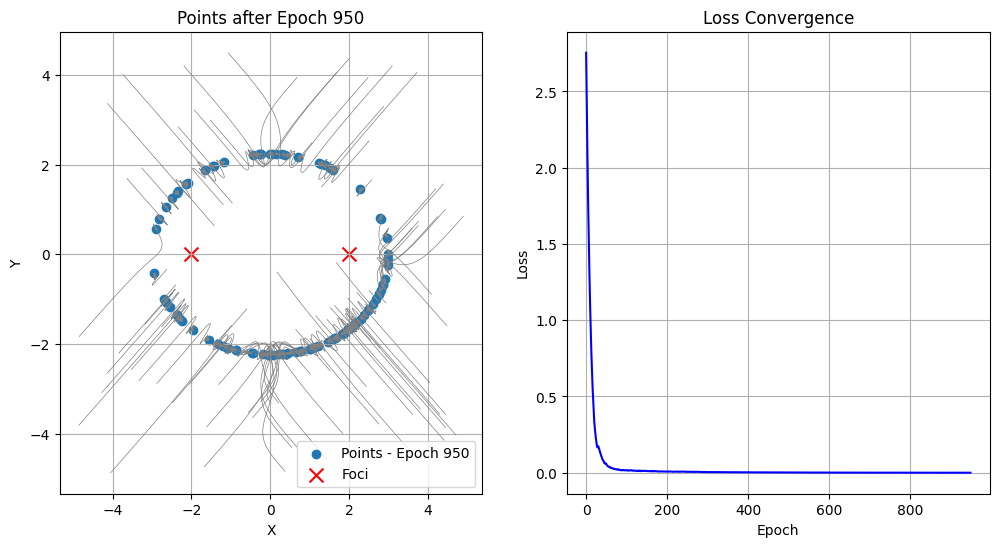

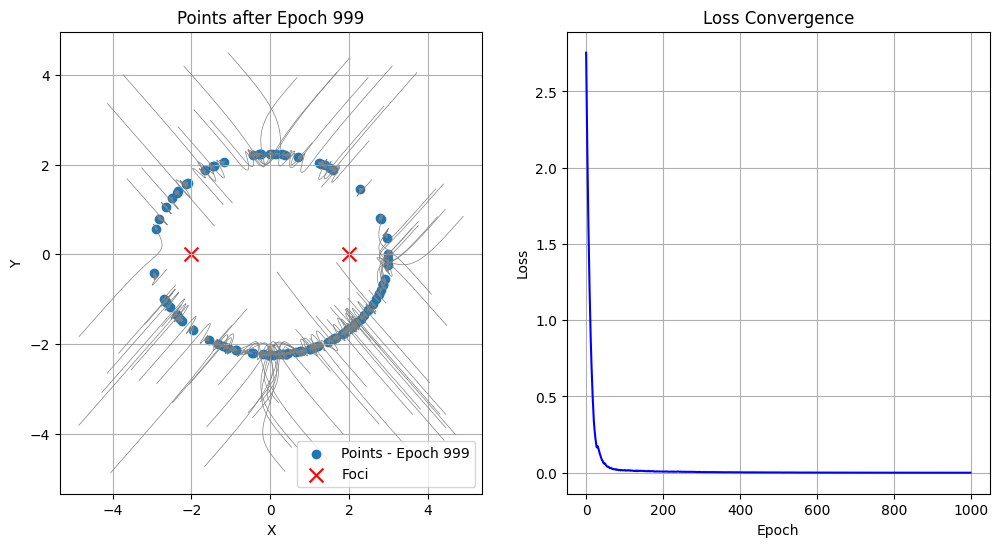

Elapsed time: 22.261680603027344 seconds


In [22]:
# Fix the random seed for reproducibility
torch.manual_seed(42)
np.random.seed(42)

# Define ellipse parameters
focus1 = torch.tensor([-2.0, 0.0])  # First focus
focus2 = torch.tensor([ 2.0, 0.0])  # Second focus
constant_sum = 6.0                  # The sum of distances to the two foci

# Initialize random 2D points from uniform distribution
num_points = 100
points = torch.rand((num_points, 2)) * 10 - 5  # Uniformly distributed in [-5, 5]
points.requires_grad = True

# Reset trajectories
trajectories = [[] for _ in range(num_points)]
loss_history = []


# Start timing
start_time = time.time()

# Define optimizer and exponential decay scheduler
optimizer = torch.optim.Adam([points], lr=0.1)
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.995)

# Training loop
num_epochs = 1000
for epoch in range(num_epochs):
    optimizer.zero_grad()

    dist1 = torch.norm(points - focus1, dim=1)
    dist2 = torch.norm(points - focus2, dim=1)

    loss_1 = torch.mean(torch.abs(dist1 + dist2 - constant_sum))
    loss_1.backward()
    optimizer.step()
    scheduler.step()

    loss_history.append(loss_1.item())

    for i in range(num_points):
        trajectories[i].append(points[i].detach().cpu().clone().numpy())

    if epoch % 50 == 0:
        print(f"Epoch {epoch}: Loss = {loss_1.item():.6f} | LR = {scheduler.get_last_lr()[0]:.6e}")
        plot_results(epoch, trajectories, loss_history)

# Final plot
plot_results(epoch, trajectories, loss_history)

end_time = time.time()
print(f"Elapsed time: {end_time - start_time} seconds")

The loss seems to have dropped to a smaller level than before, to around 0.000178. This is an improvement over the previous case with a constant learning rate. Gradually shrinking the step size enables the optimizer to navigate the shallow curvature around the optimal parameters and settle into a much tighter minimum than was possible with a fixed rate. There still is some oscillation effect, so some difficulties mentioned above still persist. We will now inspect the second of the losses.

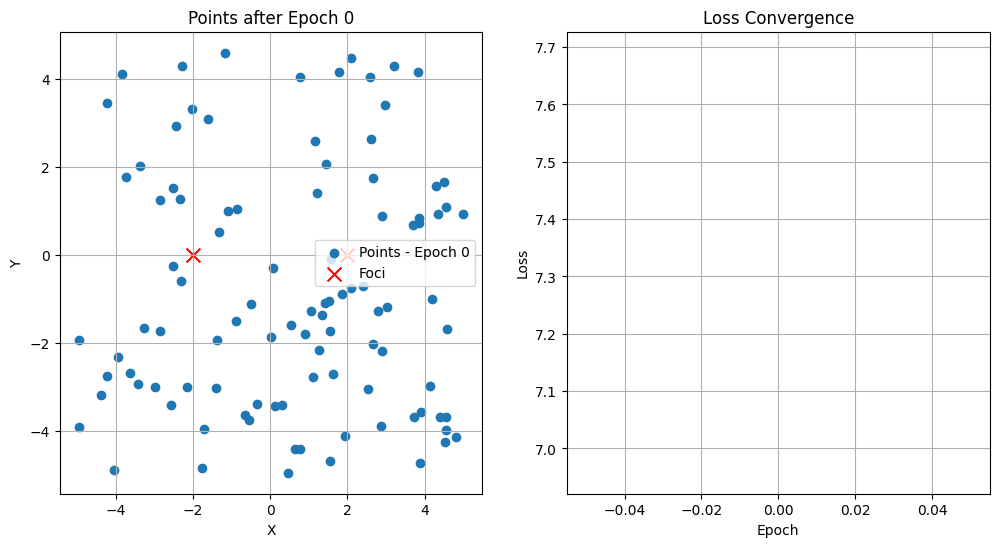

Epoch 0: Loss = 7.323938


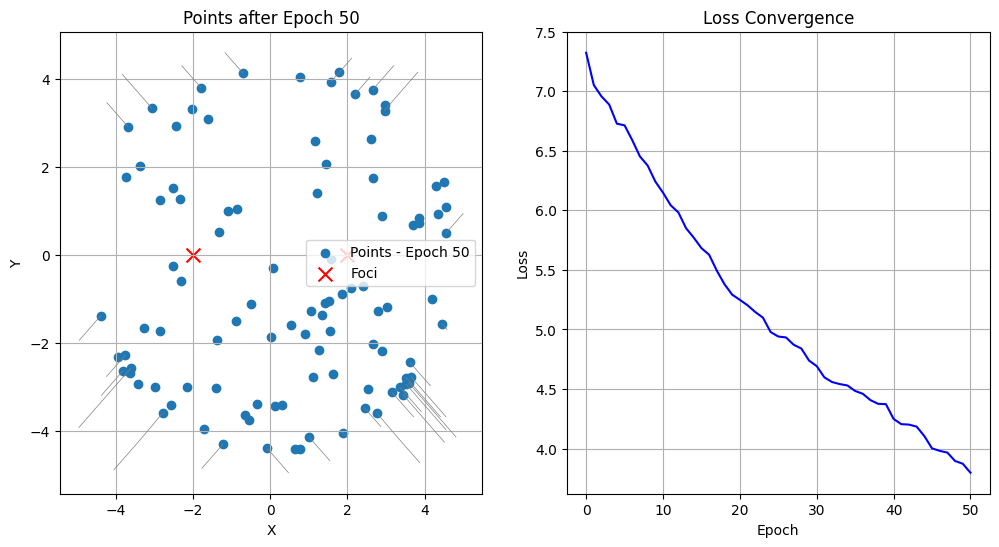

Epoch 50: Loss = 3.796906


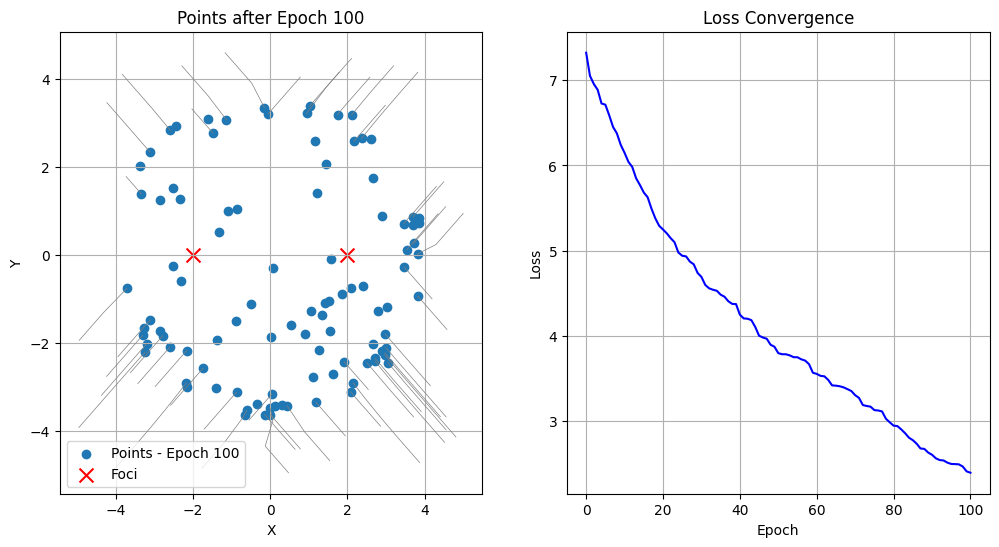

Epoch 100: Loss = 2.393175


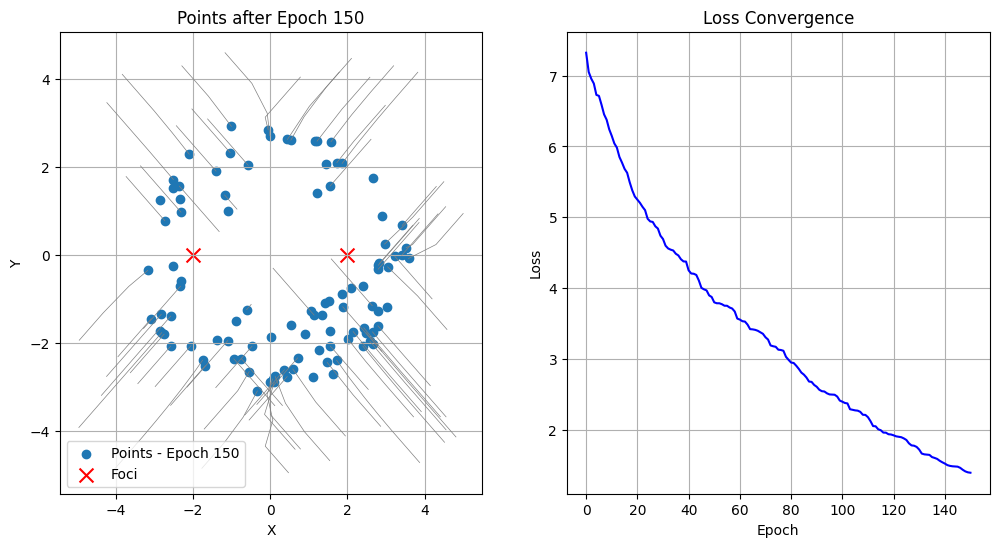

Epoch 150: Loss = 1.389654


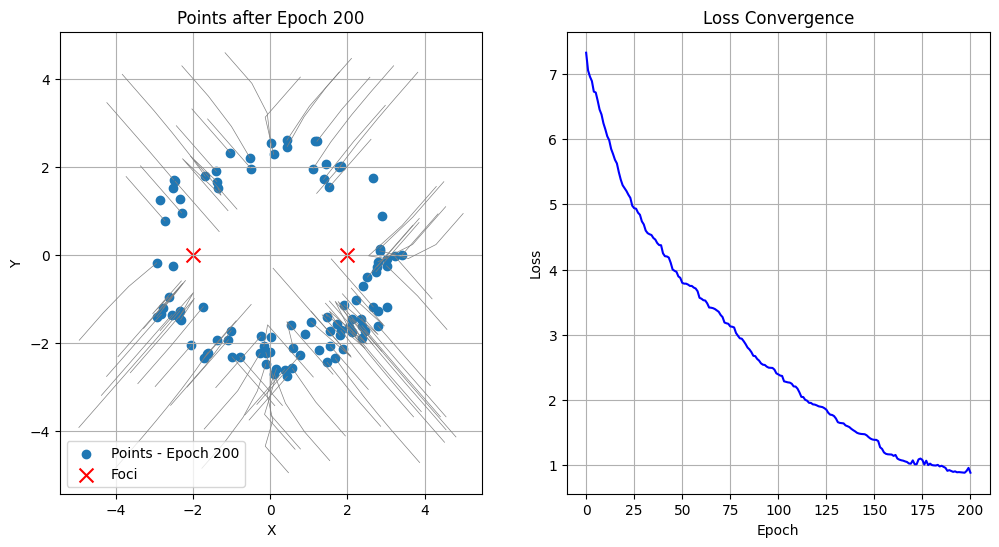

Epoch 200: Loss = 0.886059


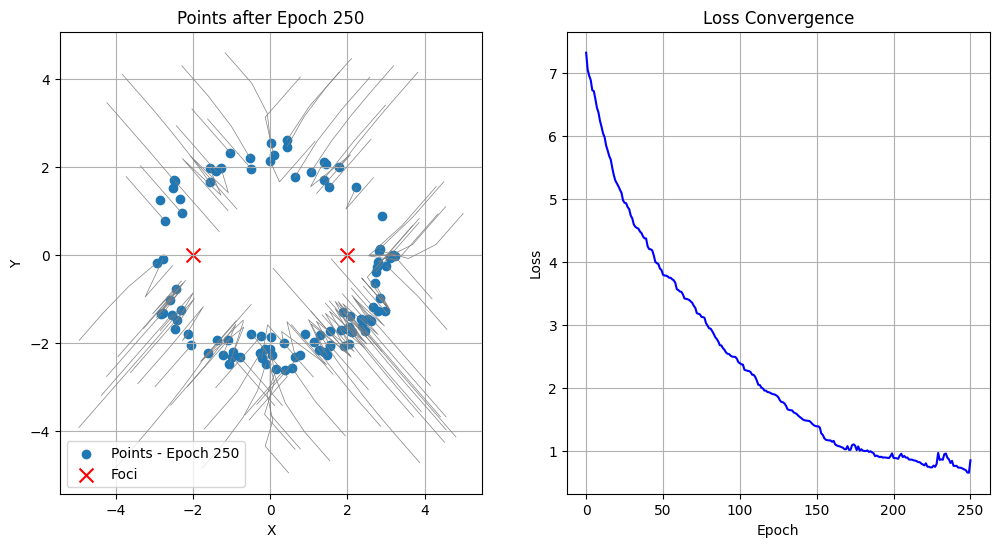

Epoch 250: Loss = 0.849135


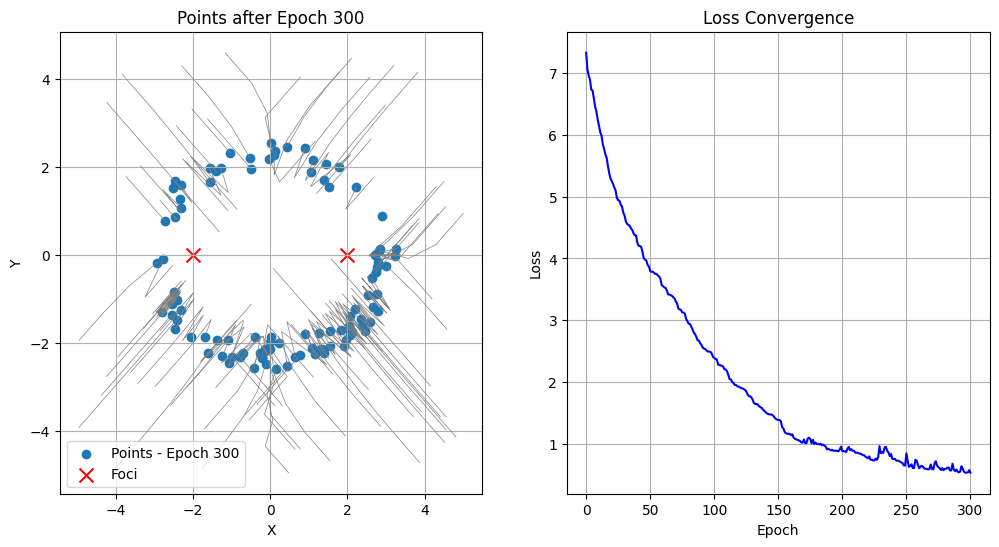

Epoch 300: Loss = 0.537401


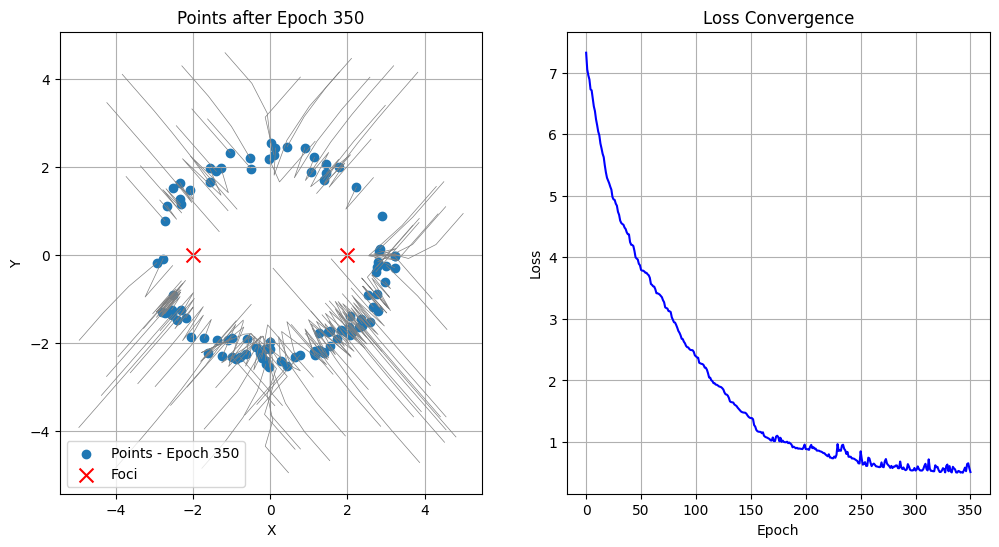

Epoch 350: Loss = 0.512818


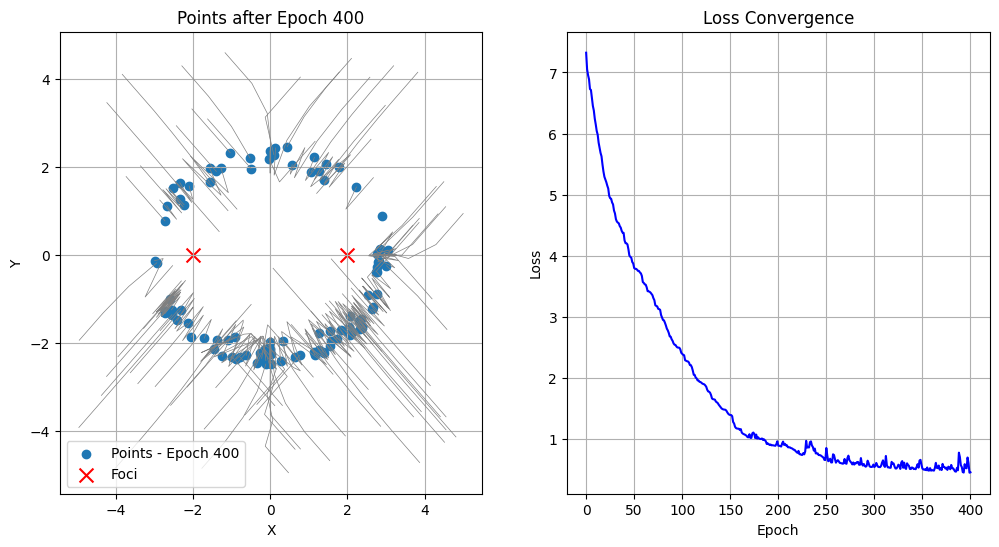

Epoch 400: Loss = 0.450674


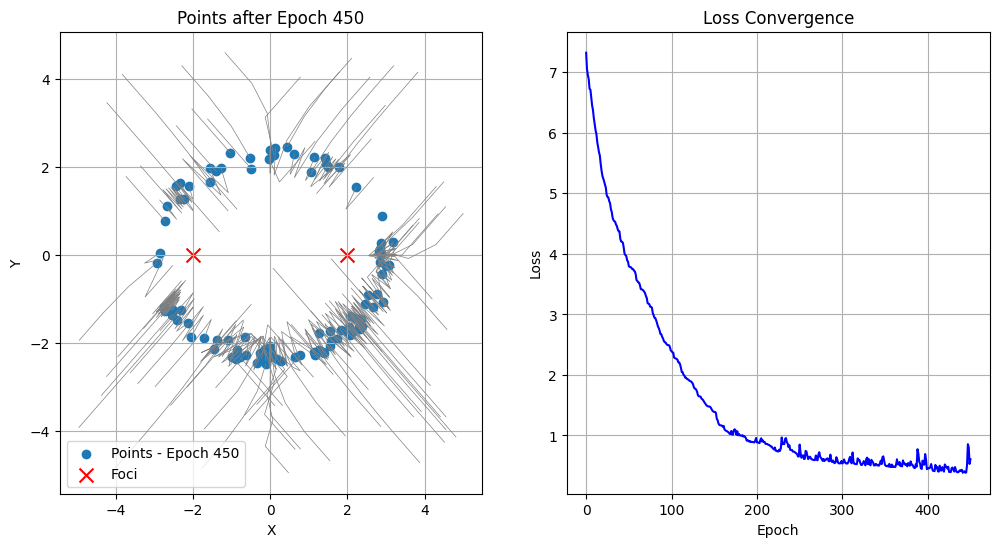

Epoch 450: Loss = 0.605150


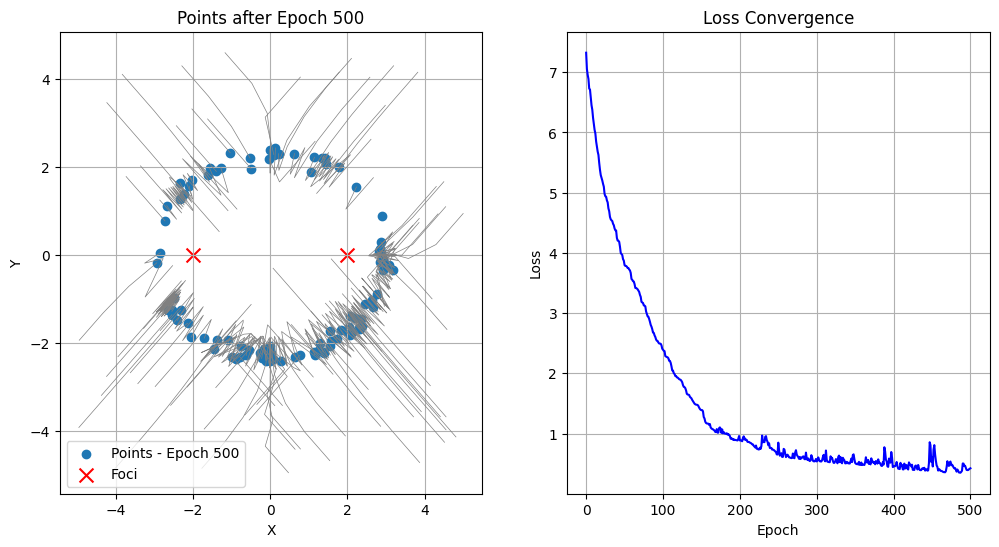

Epoch 500: Loss = 0.422950


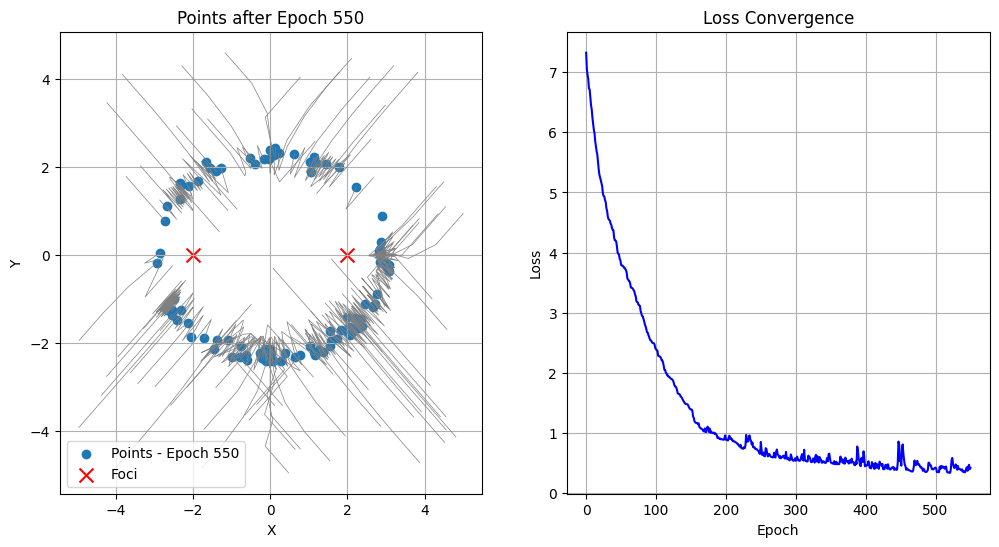

Epoch 550: Loss = 0.415530


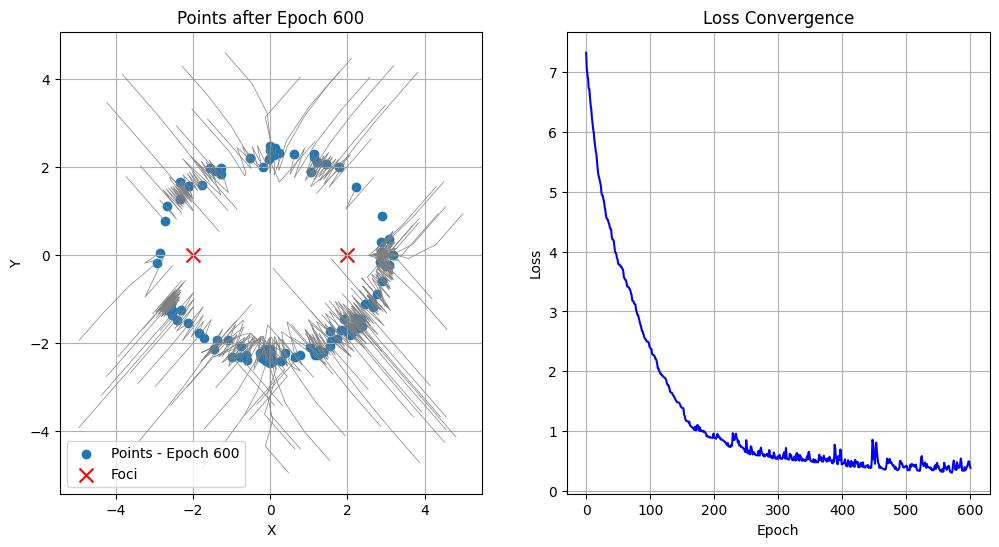

Epoch 600: Loss = 0.386727


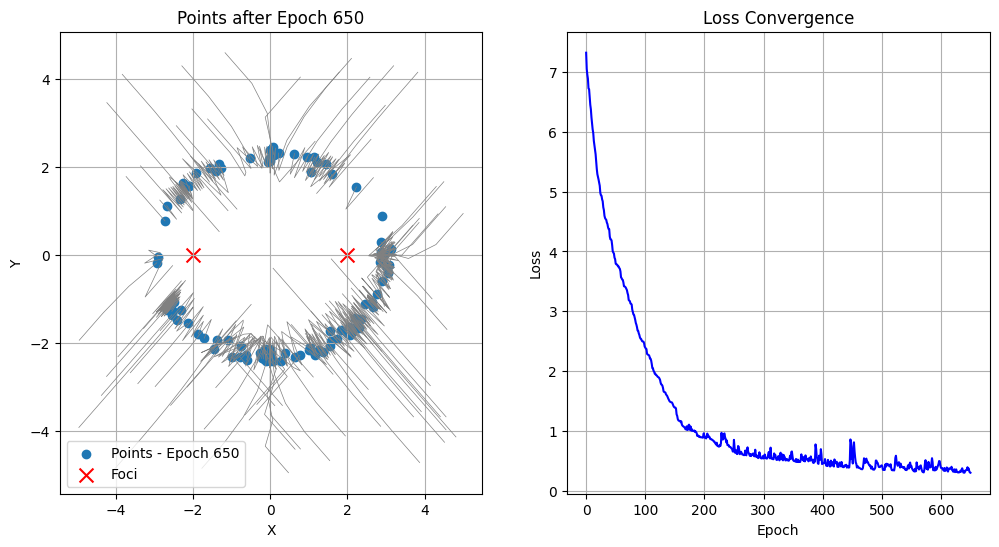

Epoch 650: Loss = 0.299376


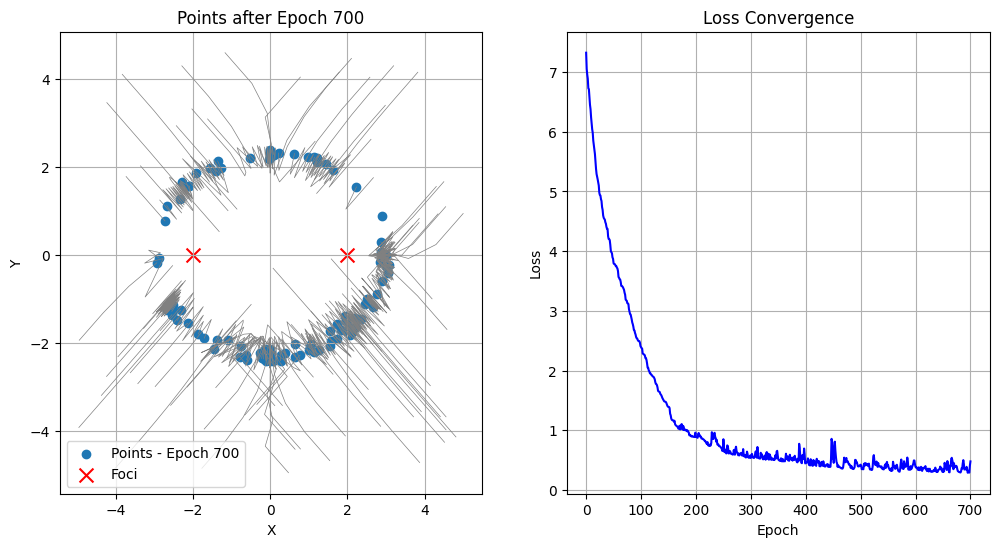

Epoch 700: Loss = 0.477610


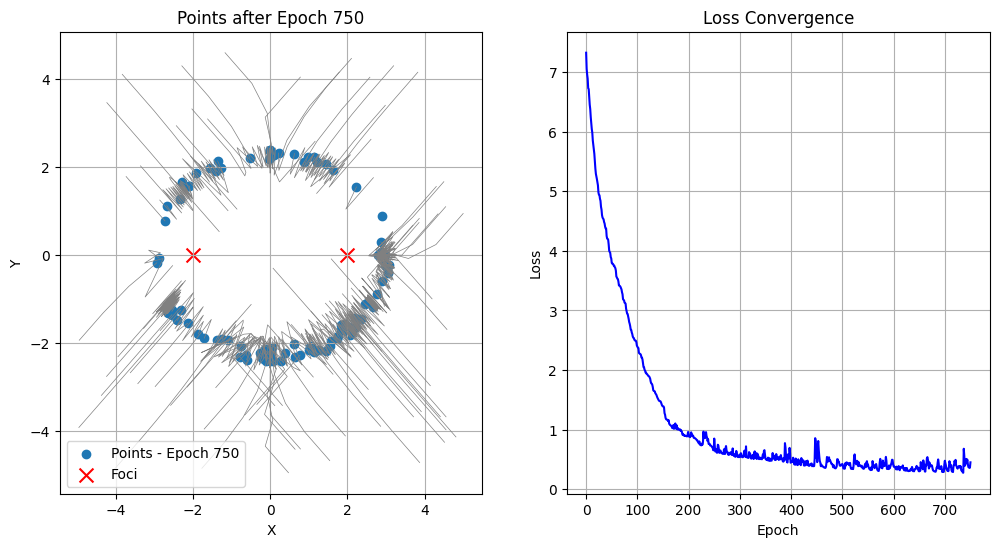

Epoch 750: Loss = 0.450883


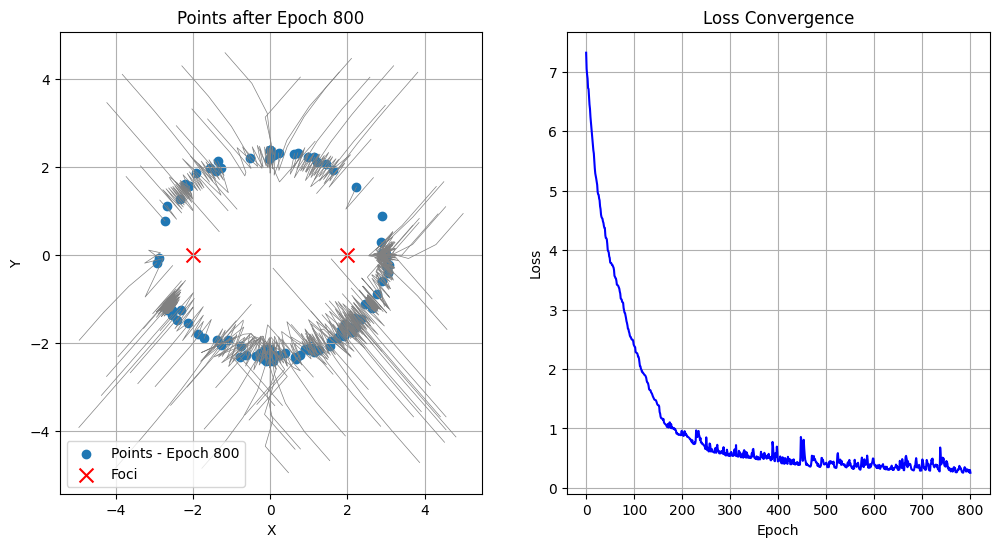

Epoch 800: Loss = 0.254017


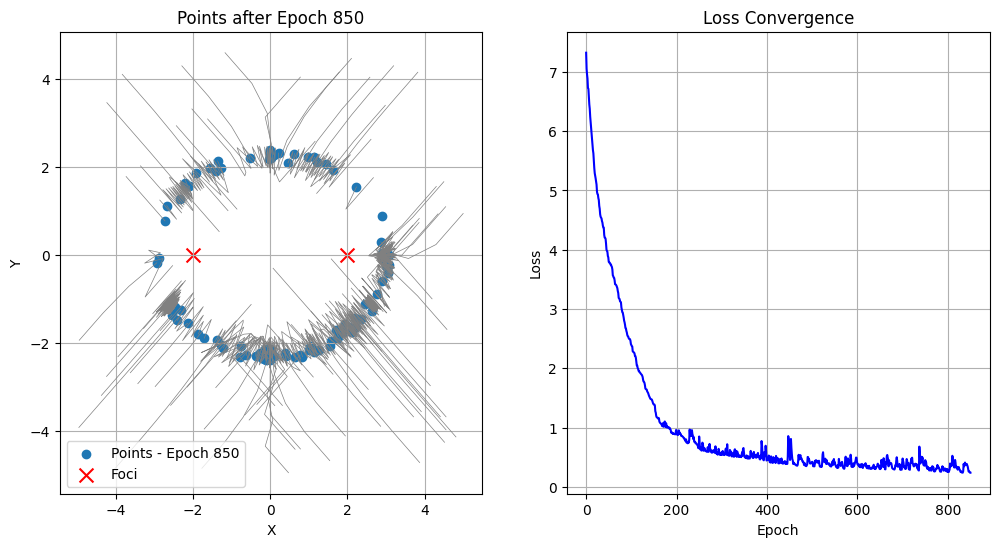

Epoch 850: Loss = 0.238534


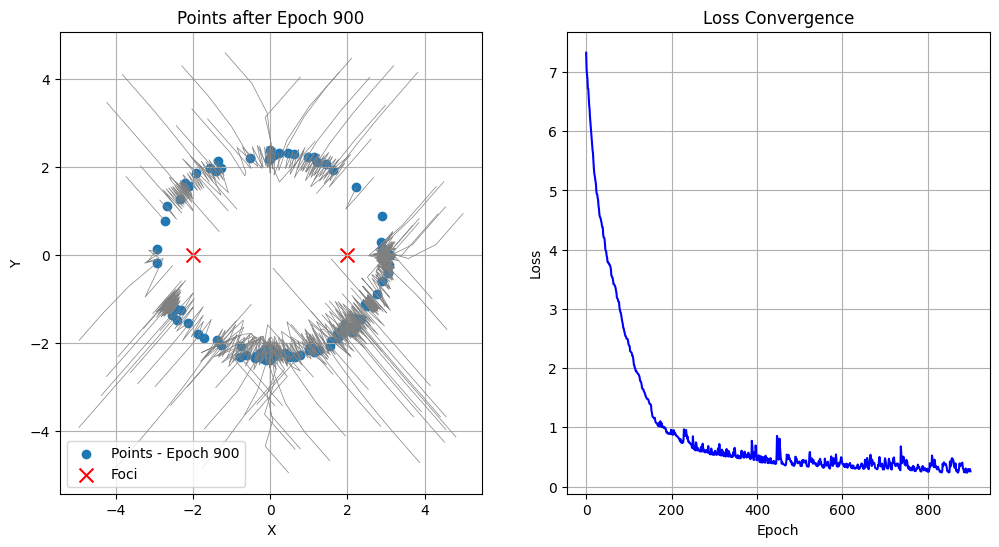

Epoch 900: Loss = 0.257051


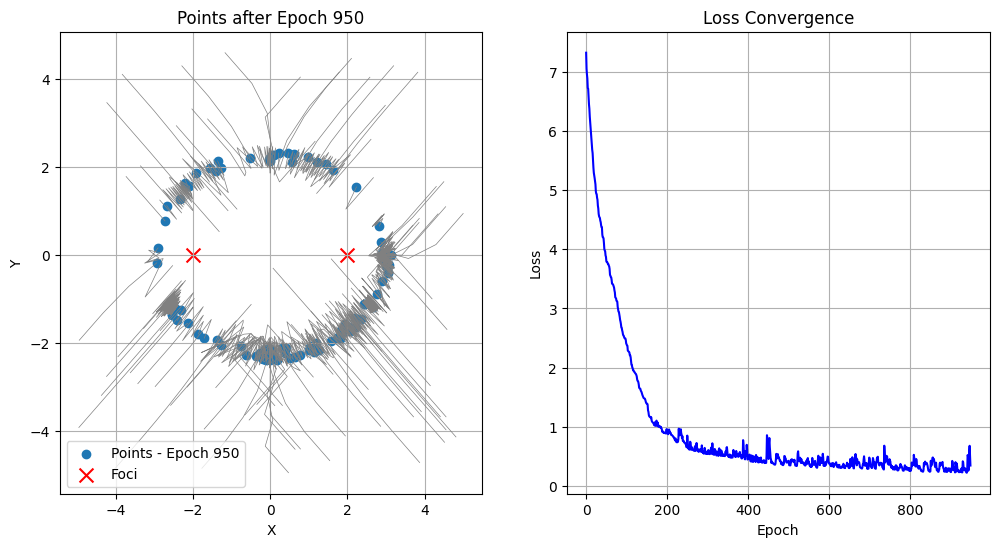

Epoch 950: Loss = 0.343328


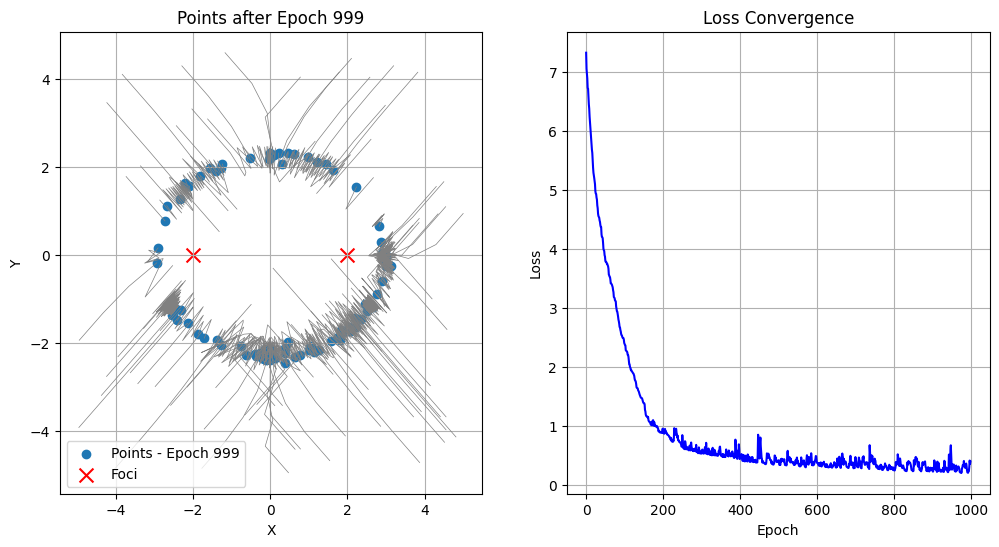

Elapsed time: 25.39093518257141 seconds


In [23]:
# The l_infty loss

# Fix the random seed for reproducibility
torch.manual_seed(42)
np.random.seed(42)

# Define ellipse parameters
focus1      = torch.tensor([-2.0, 0.0])  # First focus
focus2      = torch.tensor([ 2.0, 0.0])  # Second focus
constant_sum = 6.0                       # The sum of distances to the two foci

# Initialize random 2D points from uniform distribution
num_points = 100
points = torch.rand((num_points, 2)) * 10 - 5  # Uniformly distributed in [-5, 5]
points.requires_grad = True

# Reset trajectories and loss history
trajectories = [[] for _ in range(num_points)]
loss_history = []

# Start timing
start_time = time.time()

# Define optimizer
optimizer = torch.optim.Adam([points], lr=0.1)

# Training loop with L∞ norm
num_epochs = 1000
for epoch in range(num_epochs):
    optimizer.zero_grad()

    # Compute distances to both foci
    dist1 = torch.norm(points - focus1, dim=1)
    dist2 = torch.norm(points - focus2, dim=1)

    # ℓ∞ loss
    loss_inf = torch.max(torch.abs(dist1 + dist2 - constant_sum))
    loss_inf.backward()
    optimizer.step()

    loss_history.append(loss_inf.item())

    # Store current positions for tracking movement
    for i in range(num_points):
        trajectories[i].append(points[i].detach().cpu().clone().numpy())

    # Plot results every 50th epoch
    if epoch % 50 == 0:
        plot_results(epoch, trajectories, loss_history)
        print(f"Epoch {epoch}: Loss = {loss_inf.item():.6f}")

# Final plot
plot_results(epoch, trajectories, loss_history)

# End timing
end_time = time.time()
print(f"Elapsed time: {end_time - start_time} seconds")


Under the $\ell_\infty$ norm the loss equals the maximum absolute residual $\max_i|\varepsilon_i|$ and each gradient update addresses only the single largest deviation. As the optimizer reduces one outlier residual it immediately hands off the role of maximum to a different point, forcing the algorithm to correct errors serially rather than in parallel. The $\max$ operator is nondifferentiable whenever two or more residuals tie for the top value, yielding subgradients that switch discontinuously between coordinates and introduce high-frequency noise into the update direction. Because each step focuses exclusively on the current worst-case residual until it no longer dominates, the training trajectory oscillates through successive one-point corrections. This causes instability and lack of convergence, as seen above - the loss rises and drops, with no clear trend, so despite the long training, there is no actual long-term improvement. Let us inspect whether tweaking the learning rate could help.

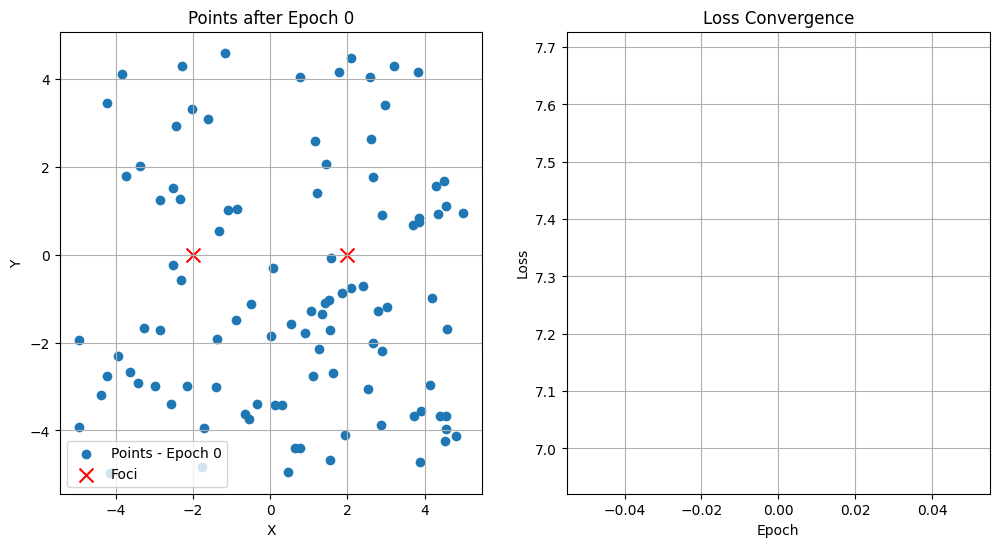

Epoch 0: Loss = 7.323938


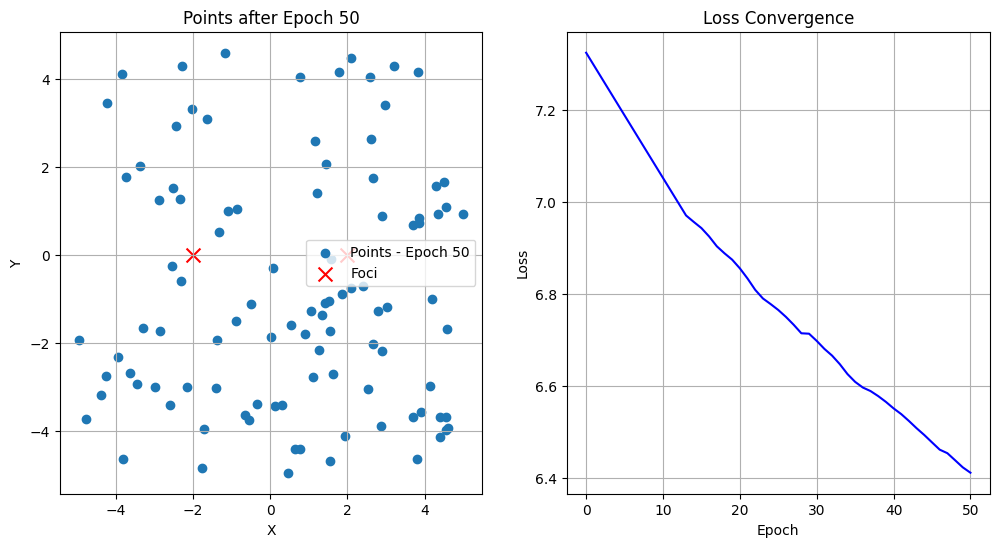

Epoch 50: Loss = 6.412273


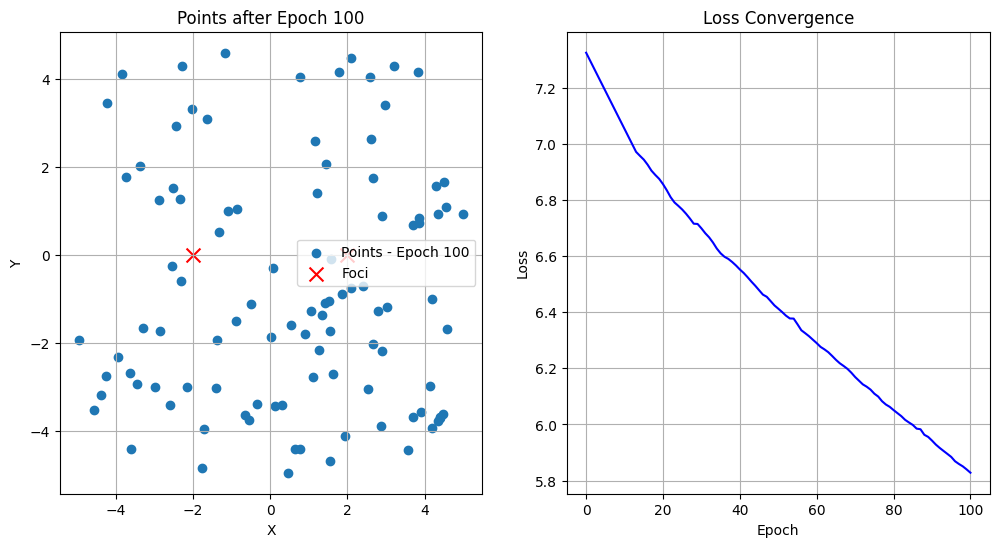

Epoch 100: Loss = 5.828051


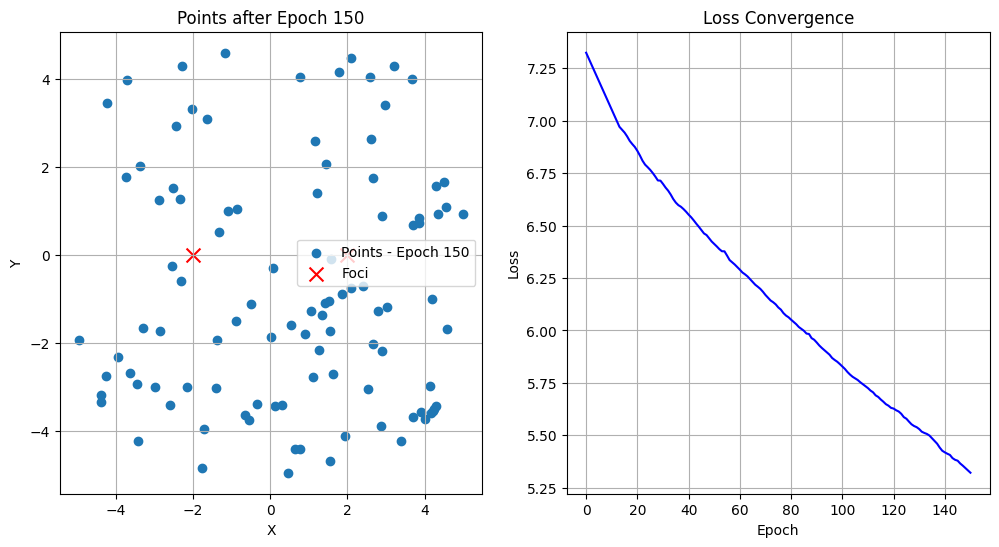

Epoch 150: Loss = 5.321583


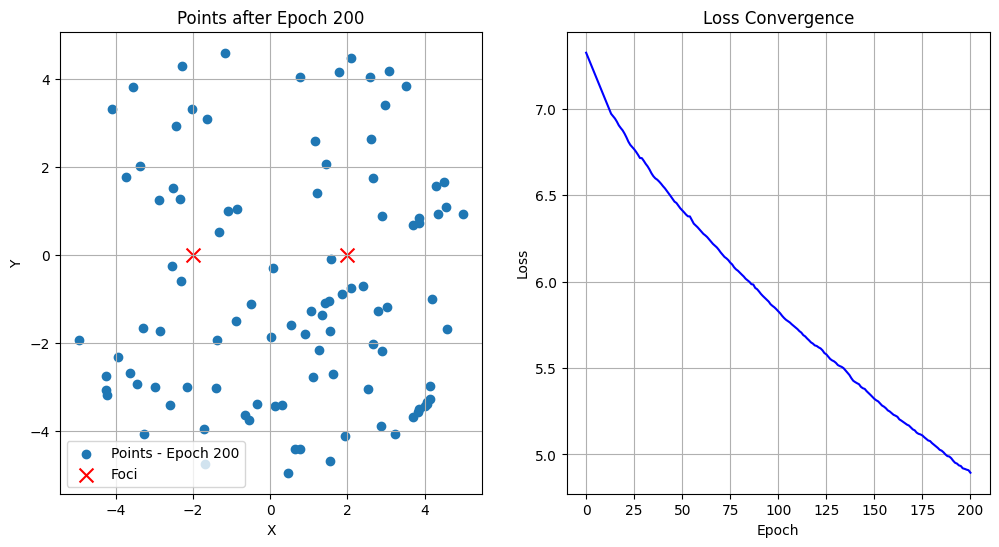

Epoch 200: Loss = 4.894296


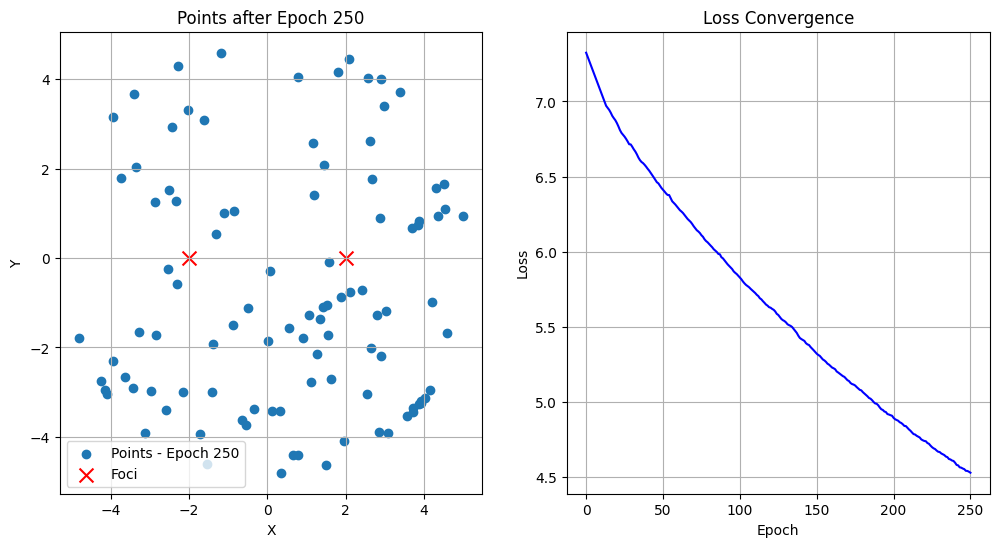

Epoch 250: Loss = 4.529440


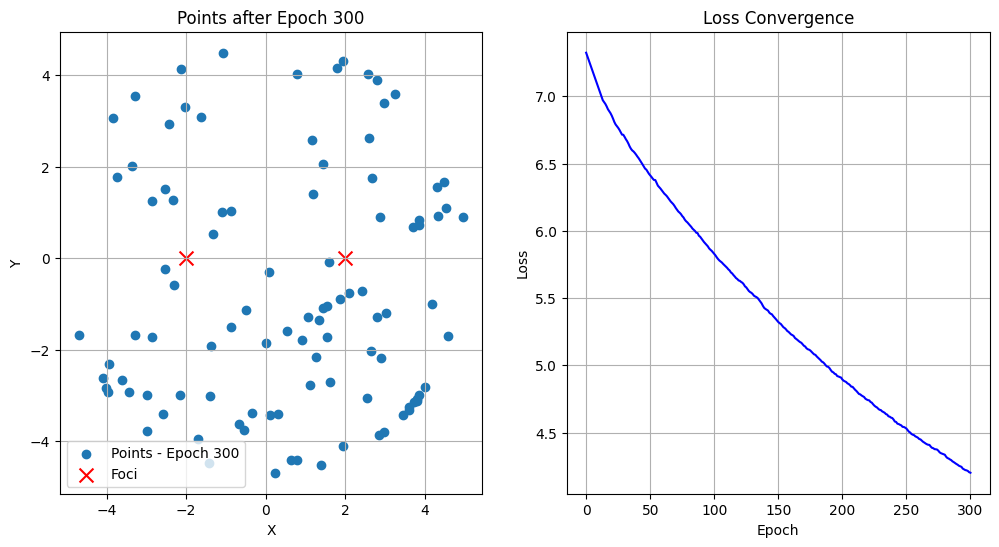

Epoch 300: Loss = 4.200984


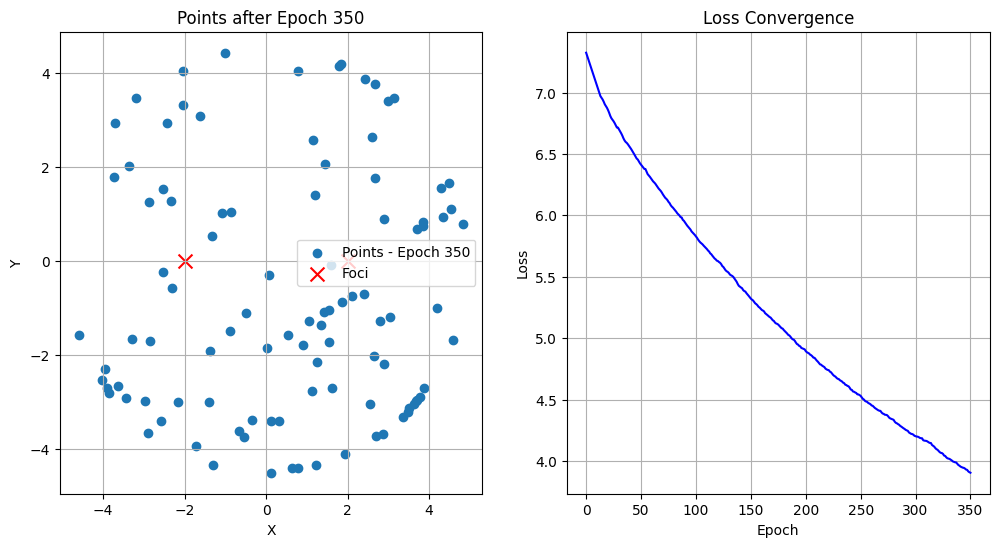

Epoch 350: Loss = 3.903862


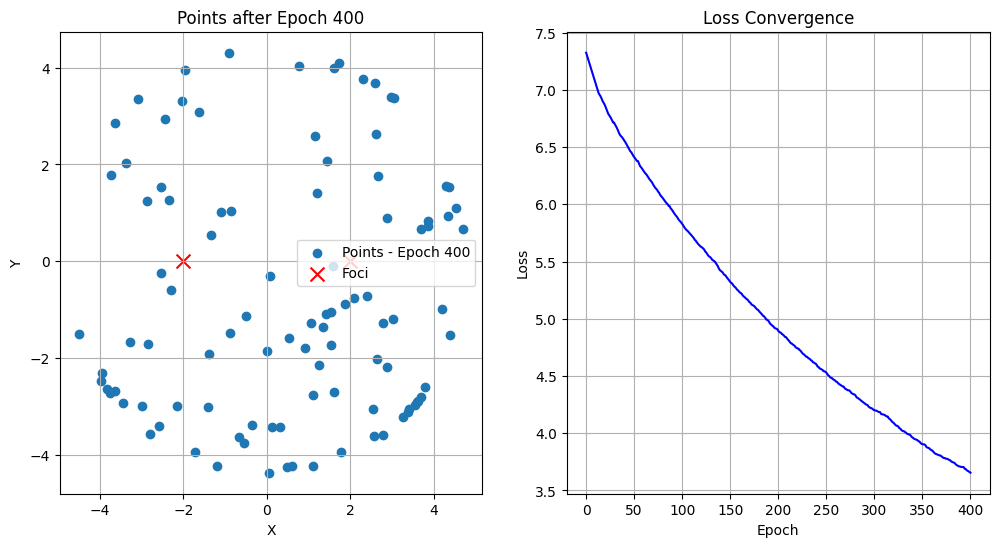

Epoch 400: Loss = 3.654833


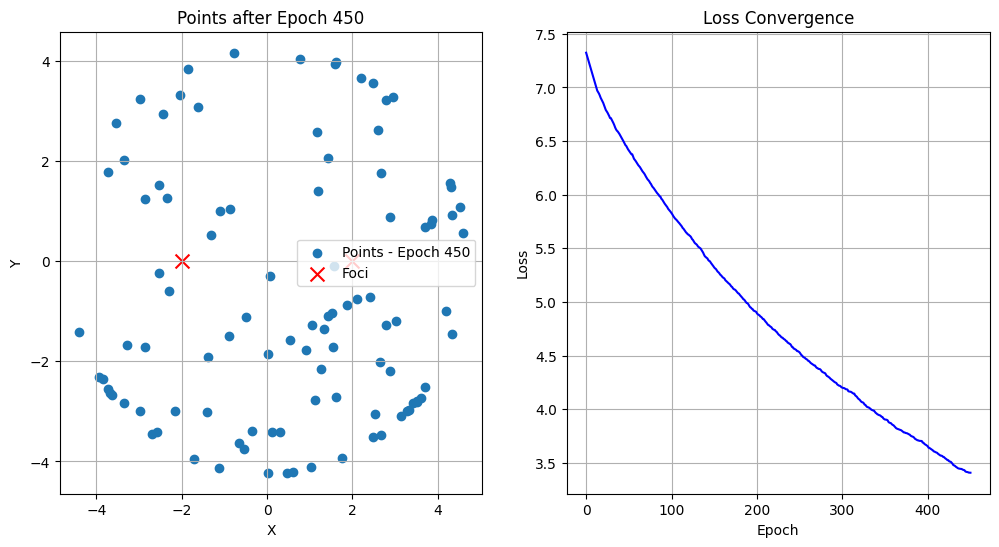

Epoch 450: Loss = 3.408179


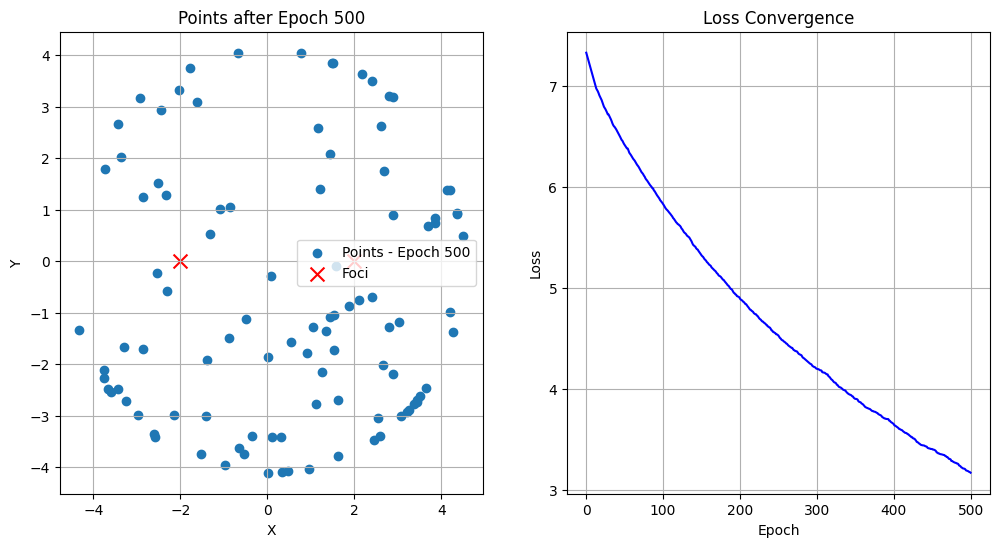

Epoch 500: Loss = 3.174255


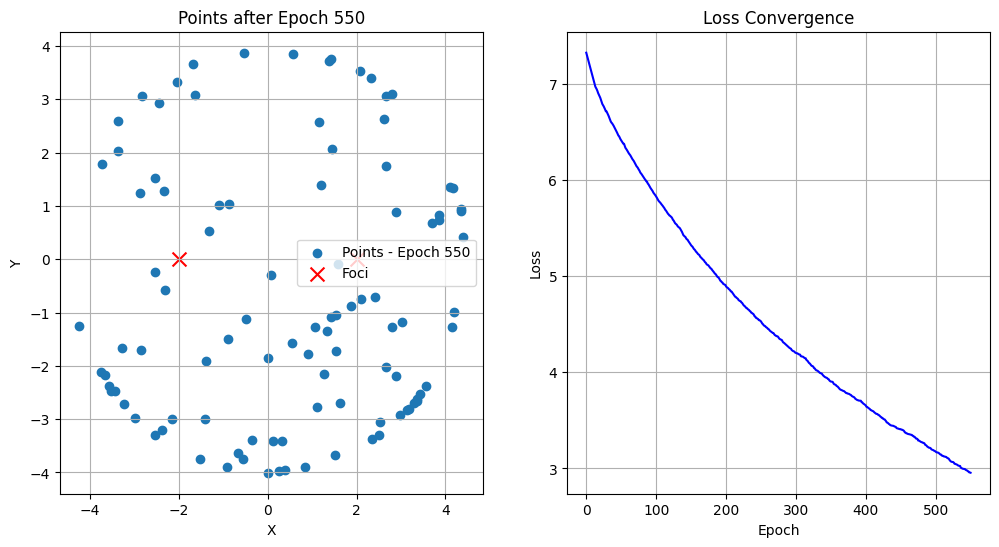

Epoch 550: Loss = 2.955410


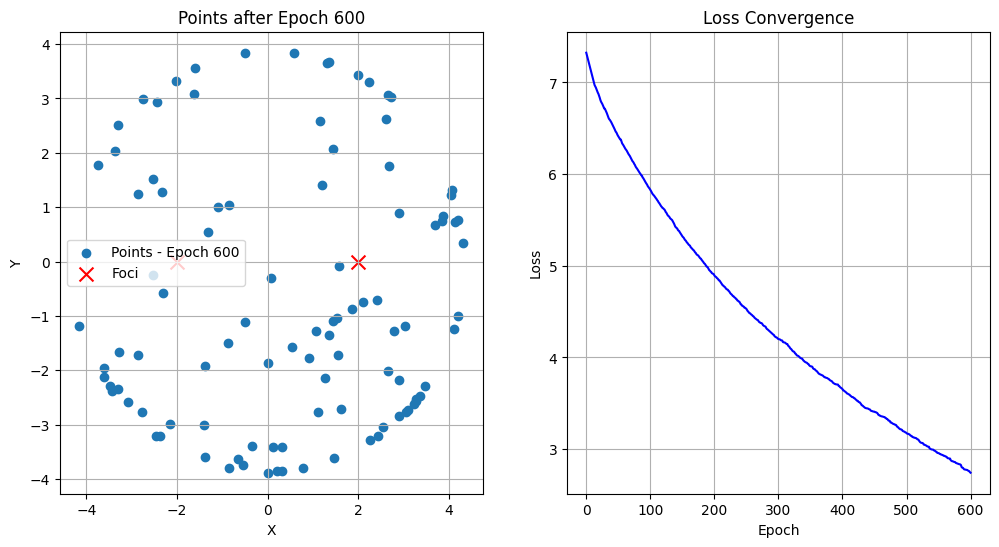

Epoch 600: Loss = 2.742335


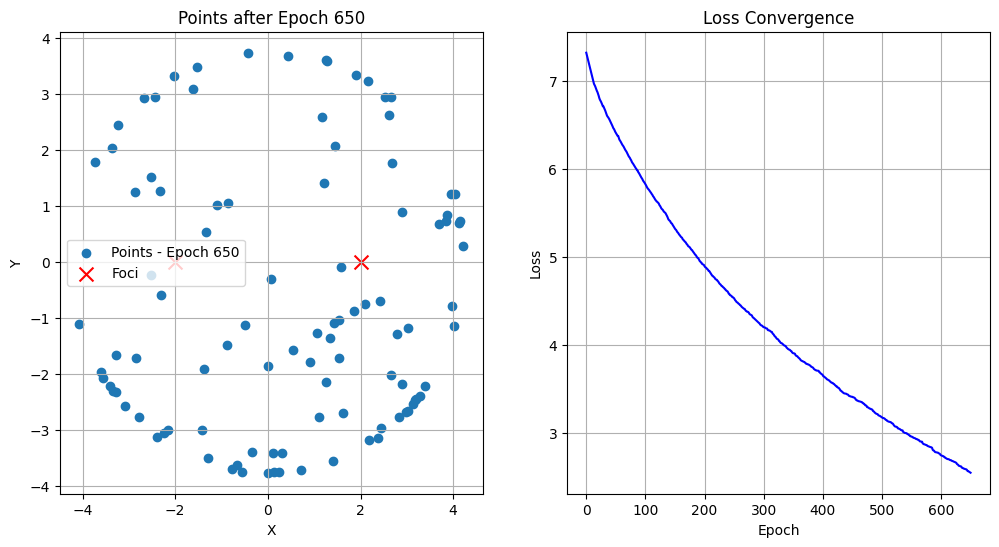

Epoch 650: Loss = 2.544035


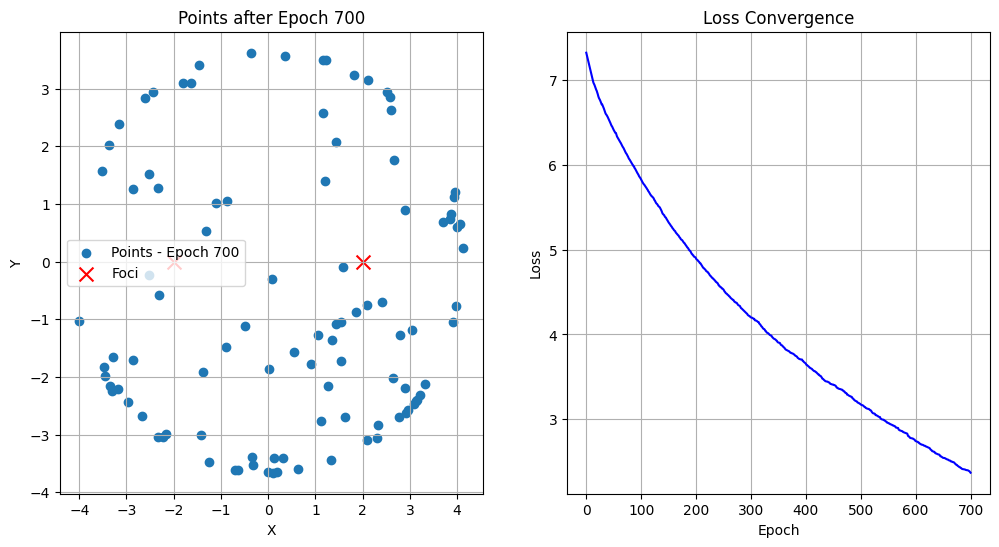

Epoch 700: Loss = 2.368706


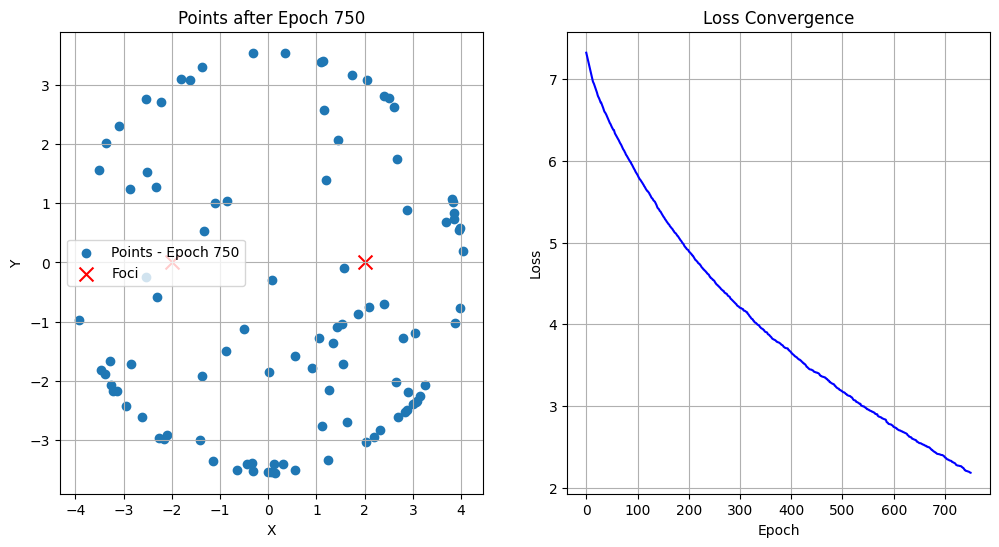

Epoch 750: Loss = 2.181423


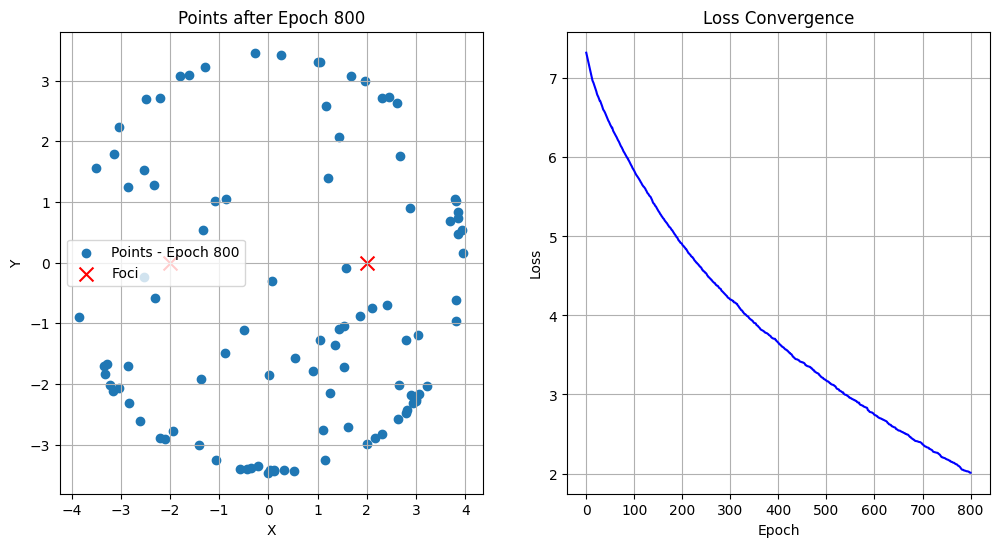

Epoch 800: Loss = 2.010027


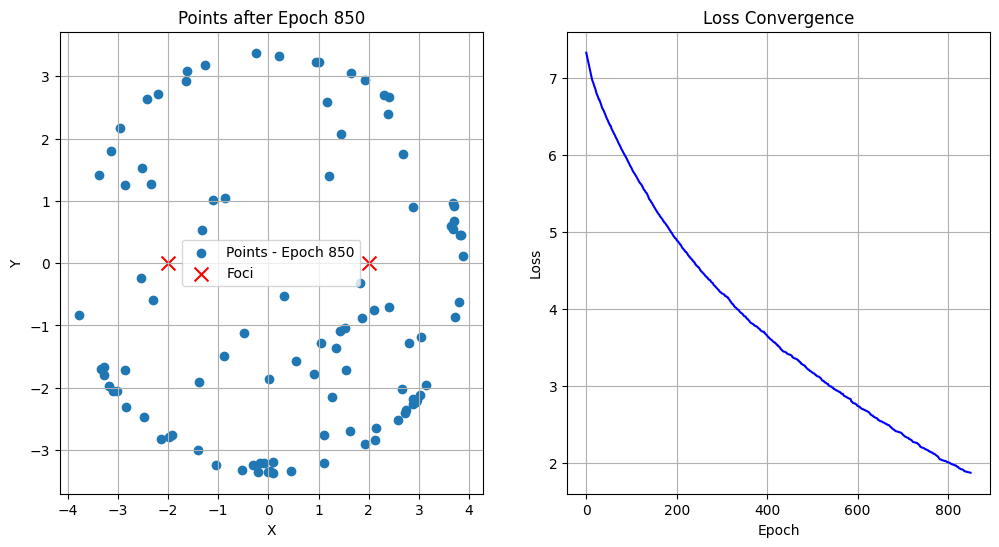

Epoch 850: Loss = 1.874865


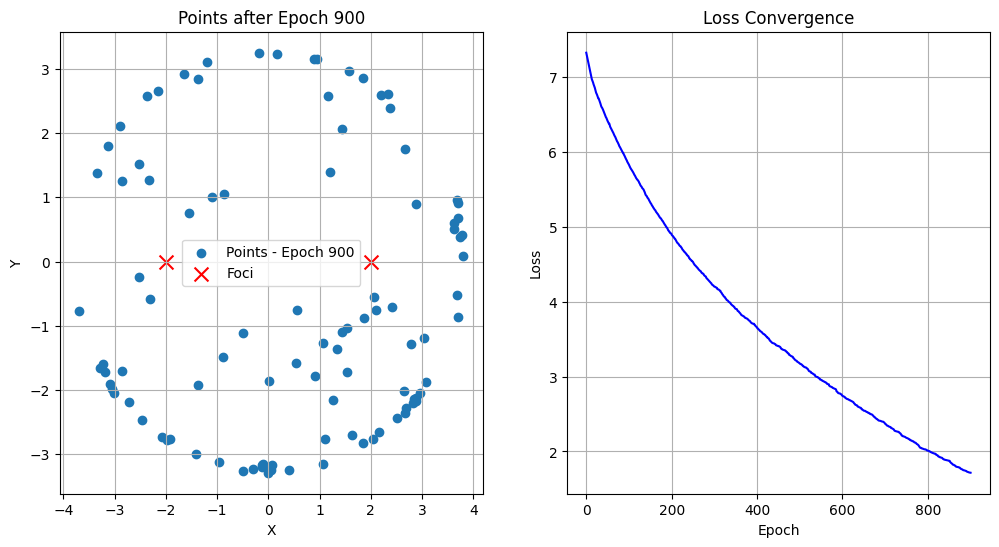

Epoch 900: Loss = 1.715739


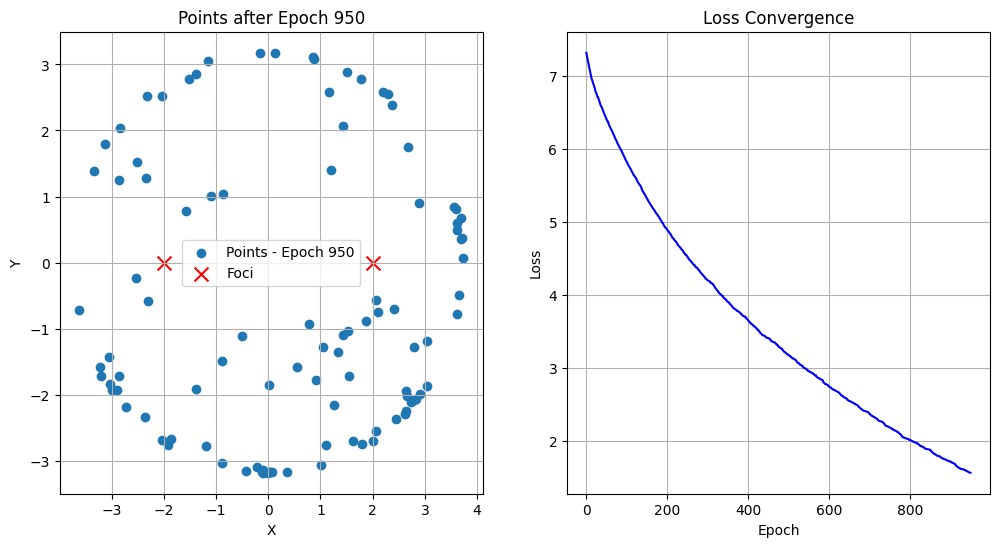

Epoch 950: Loss = 1.560923


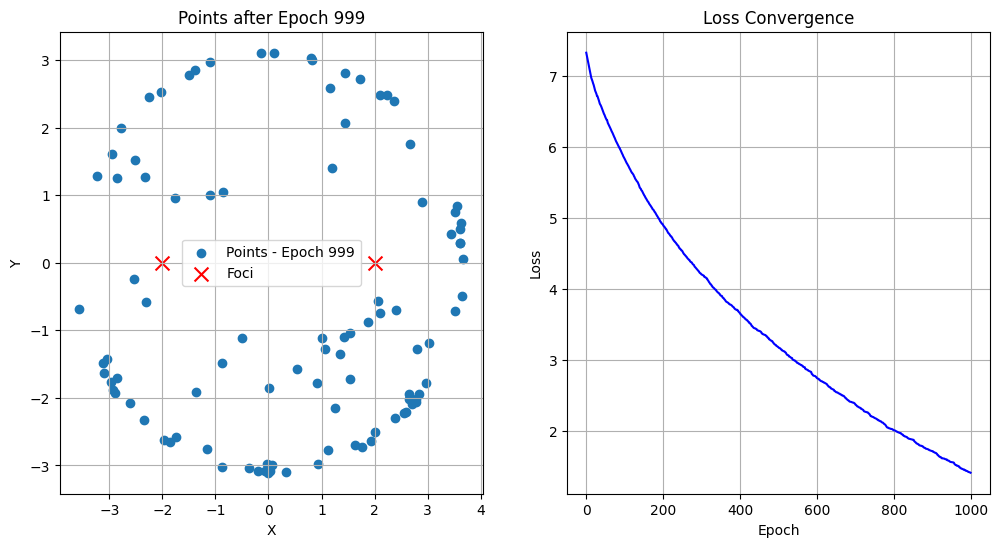

Elapsed time: 19.48 seconds


In [24]:
# Fix the random seed for reproducibility
torch.manual_seed(42)
np.random.seed(42)

# Define ellipse parameters
focus1      = torch.tensor([-2.0, 0.0])  # First focus
focus2      = torch.tensor([ 2.0, 0.0])  # Second focus
constant_sum = 6.0                       # Sum of distances to the two foci

# Initialize random 2D points
num_points = 100
points = torch.rand((num_points, 2)) * 10 - 5
points.requires_grad = True

# Reset trajectories and loss history
trajectories = [[] for _ in range(num_points)]
loss_history = []

# Start timing
start_time = time.time()

# Define optimizer with a smaller constant learning rate
optimizer = torch.optim.Adam([points], lr=0.01)

# Training loop using the ℓ∞ norm
num_epochs = 1000
for epoch in range(num_epochs):
    optimizer.zero_grad()

    dist1 = torch.norm(points - focus1, dim=1)
    dist2 = torch.norm(points - focus2, dim=1)

    loss_inf = torch.max(torch.abs(dist1 + dist2 - constant_sum))
    loss_inf.backward()
    optimizer.step()

    loss_history.append(loss_inf.item())

    for i in range(num_points):
        trajectories[i].append(points[i].detach().cpu().numpy())

    if epoch % 50 == 0:
        plot_results(epoch, trajectories, loss_history)
        print(f"Epoch {epoch}: Loss = {loss_inf.item():.6f}")

# Final plot
plot_results(epoch, trajectories, loss_history)

end_time = time.time()
print(f"Elapsed time: {end_time - start_time:.2f} seconds")


The result is much worse - decreasing the learning rate caused each update becoming too timid to pull down the current maximum residual before a different point took over as the worst case. Because the loss is driven by the single largest deviation, a small learning rate means the optimizer spends many more iterations nibbling at that one outlier without ever getting it below the level of the next‐highest error. In effect, the update magnitude falls below the gap between the top two residuals, so the optimizer never manages to reduce the maximum before the focus shifts. Meanwhile, stochastic subgradient noise remains of roughly the same scale, so the signal‐to‐noise ratio actually worsens, and progress stalls. All in all, unlike in the previous case with the other norm, a decrease in learning rate did not solve convergence issues.